<a href="https://colab.research.google.com/github/FerdinanSilaen/Analisis_Spasial_KDMP_Banyumas/blob/main/notebook/Analisis_Spasial_KDMP_Banyumas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 1. Install specific osmnx version alongside other spatial libraries.
!pip install -q "osmnx<2.0" h3 keplergl mapclassify pyarrow

import os
import numpy as np
import pandas as pd
import geopandas as gpd
import osmnx as ox
import shapely
import matplotlib.pyplot as plt

# 2. Konfigurasi osmnx
ox.settings.use_cache = True
ox.settings.log_console = False

# 3. Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# 4. Definisikan folder kerja proyek
PROJECT_DIR = '/content/drive/MyDrive/KDMP_Banyumas'
DATA_DIR    = os.path.join(PROJECT_DIR, 'data')
os.makedirs(DATA_DIR, exist_ok=True)

# 5. Cek versi untuk memastikan environment siap
print('osmnx     :', ox.__version__)
print('geopandas :', gpd.__version__)
print('shapely   :', shapely.__version__)
print('PROJECT_DIR:', PROJECT_DIR)
print('DATA_DIR   :', DATA_DIR)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.4/18.4 MB 49.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 62.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.8/910.8 kB 36.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the

In [ ]:
# =========================================================
# TAHAP 1A — Load koperasi.csv dari Drive
# =========================================================
CSV_PATH = os.path.join(DATA_DIR, 'koperasi.csv')
assert os.path.exists(CSV_PATH), (
    f'File tidak ditemukan: {CSV_PATH}\n'
    'Upload koperasi.csv ke folder tersebut dulu, lalu jalankan ulang sel ini.'
)

df = pd.read_csv(CSV_PATH)
print(f'Jumlah koperasi : {len(df)}')
print('Kolom           :', list(df.columns))
df.head()

Jumlah koperasi : 117
Kolom           : ['no', 'nama_koperasi', 'provinsi', 'kota', 'kecamatan', 'desa', 'progres_pct', 'kategori_progres', 'longitude', 'latitude']


,no,nama_koperasi,provinsi,kota,kecamatan,desa,progres_pct,kategori_progres,longitude,latitude
0,1,KOPERASI DESA MERAH PUTIH LEDUG KECAMATAN KEMB...,JAWA TENGAH,KAB. BANYUMAS,Kembaran,Ledug,100.0,100%,109.274867,-7.426658
1,2,KOPERASI DESA MERAH PUTIH JIPANG KECAMATAN KAR...,JAWA TENGAH,KAB. BANYUMAS,Karanglewas,Jipang,100.0,100%,109.191585,-7.401390
2,3,KOPERASI DESA MERAH PUTIH SUSUKAN KECAMATAN SU...,JAWA TENGAH,KAB. BANYUMAS,Sumbang,Susukan,100.0,100%,109.290286,-7.364631
3,4,KOPERASI DESA MERAH PUTIH SROWOT KECAMATAN KAL...,JAWA TENGAH,KAB. BANYUMAS,Kalibagor,Srowot,100.0,100%,109.321179,-7.508081
4,5,KOPERASI DESA MERAH PUTIH GENTAWANGI KECAMATAN...,JAWA TENGAH,KAB. BANYUMAS,Jatilawang,Gentawangi,100.0,100%,109.124499,-7.523406


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# =========================================================
# TAHAP 1B — Konversi ke GeoDataFrame (titik koperasi)
# =========================================================
gdf_koperasi = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df['longitude'], df['latitude']),
    crs='EPSG:4326'      # WGS84
)
print('CRS:', gdf_koperasi.crs)
gdf_koperasi[['nama_koperasi', 'kecamatan', 'desa', 'geometry']].head()

CRS: EPSG:4326


,nama_koperasi,kecamatan,desa,geometry
0,KOPERASI DESA MERAH PUTIH LEDUG KECAMATAN KEMB...,Kembaran,Ledug,POINT (109.27487 -7.42666)
1,KOPERASI DESA MERAH PUTIH JIPANG KECAMATAN KAR...,Karanglewas,Jipang,POINT (109.19159 -7.40139)
2,KOPERASI DESA MERAH PUTIH SUSUKAN KECAMATAN SU...,Sumbang,Susukan,POINT (109.29029 -7.36463)
3,KOPERASI DESA MERAH PUTIH SROWOT KECAMATAN KAL...,Kalibagor,Srowot,POINT (109.32118 -7.50808)
4,KOPERASI DESA MERAH PUTIH GENTAWANGI KECAMATAN...,Jatilawang,Gentawangi,POINT (109.12450 -7.52341)


In [ ]:
# =========================================================
# TAHAP 1C — Ambil batas administrasi Kab. Banyumas dari OSM
# =========================================================
PLACE = 'Kabupaten Banyumas, Jawa Tengah, Indonesia'
gdf_boundary = ox.geocode_to_gdf(PLACE)

# Luas wilayah (reproyeksi sementara ke UTM 49S untuk hitung km2)
luas_km2 = gdf_boundary.to_crs('EPSG:32749').area.iloc[0] / 1e6
print('Wilayah    :', gdf_boundary.loc[0, 'display_name'])
print(f'Luas        : {luas_km2:,.1f} km2   (referensi Banyumas ~1.300+ km2)')

Wilayah    : Banyumas, Central Java, Java, Indonesia
Luas        : 1,390.2 km2   (referensi Banyumas ~1.300+ km2)


In [ ]:
# =========================================================
# TAHAP 1D — Validasi: cek koperasi di dalam/luar boundary
# =========================================================
boundary_poly = gdf_boundary.geometry.iloc[0]
gdf_koperasi['di_dalam_banyumas'] = gdf_koperasi.within(boundary_poly)

n_in  = int(gdf_koperasi['di_dalam_banyumas'].sum())
n_out = len(gdf_koperasi) - n_in
print(f'Di dalam boundary : {n_in}')
print(f'Di luar boundary  : {n_out}')

if n_out > 0:
    print('\nKoperasi di luar boundary (perlu dicek koordinatnya):')
    print(
        gdf_koperasi.loc[
            ~gdf_koperasi['di_dalam_banyumas'],
            ['no', 'nama_koperasi', 'kecamatan', 'longitude', 'latitude']
        ].to_string(index=False)
    )

Di dalam boundary : 117
Di luar boundary  : 0


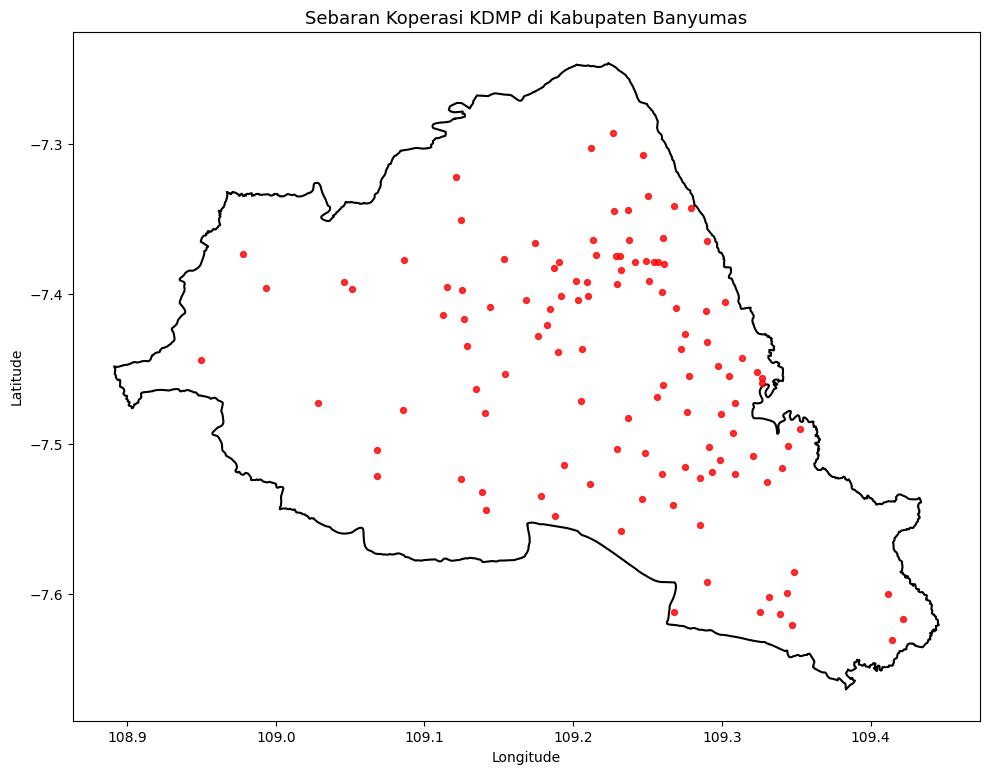

In [ ]:
# =========================================================
# TAHAP 1E — Peta validasi visual
# =========================================================
fig, ax = plt.subplots(figsize=(10, 10))
gdf_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5)
gdf_koperasi.plot(ax=ax, color='red', markersize=18, alpha=0.8)
ax.set_title('Sebaran Koperasi KDMP di Kabupaten Banyumas', fontsize=13)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
plt.tight_layout(); plt.show()

Peta sebaran koperasi KDMP di Kabupaten Banyumas menunjukkan pola persebaran yang tidak merata dan cenderung mengelompok di koridor tengah–timur kabupaten (sekitar 109,2–109,3 BT; -7,4 sampai -7,5 LS), yakni area Purwokerto dan kecamatan padat di sekitarnya seperti Sumbang, Kembaran, Sokaraja, dan Kedungbanteng, sejalan dengan tingginya kepadatan permukiman dan aksesibilitas di wilayah tersebut. Sebaliknya, bagian barat (Lumbir, Gumelar, Pekuncen) dan sebagian selatan relatif jarang dan menyebar tipis, mengindikasikan adanya kesenjangan layanan koperasi, meskipun secara keseluruhan hampir seluruh penjuru kabupaten masih terjangkau minimal beberapa titik. Pola ini menjadi dasar penting bagi analisis Goal 1: wilayah yang masih kosong menjadi kandidat titik ekspansi, sementara koperasi di zona pinggiran menjadi prioritas pendampingan. Perlu dicatat bahwa peta ini baru menggambarkan dimensi lokasi (di mana koperasi berada), sedangkan dimensi potensi komoditas unggulan tiap wilayah dianalisis lebih lanjut melalui Location Quotient pada dashboard interaktif.

In [ ]:
# =========================================================
# TAHAP 1F — Simpan hasil ke Drive untuk dipakai tahap berikutnya
# =========================================================
gdf_koperasi.to_file(os.path.join(DATA_DIR, 'koperasi.gpkg'), driver='GPKG')
gdf_boundary[['geometry']].to_file(
    os.path.join(DATA_DIR, 'banyumas_boundary.gpkg'), driver='GPKG'
)
print('Tersimpan di', DATA_DIR)
print(' - koperasi.gpkg')
print(' - banyumas_boundary.gpkg')

Tersimpan di /content/drive/MyDrive/KDMP_Banyumas/data
 - koperasi.gpkg
 - banyumas_boundary.gpkg


In [ ]:
# =========================================================
# TAHAP 2A — Persiapan scraping OSM
# =========================================================
import os
import geopandas as gpd
import osmnx as ox
import pandas as pd

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'   # samakan dengan Tahap 0

ox.settings.use_cache = True
ox.settings.timeout    = 900     # detik; antisipasi query besar (bangunan)

gdf_boundary = gpd.read_file(os.path.join(DATA_DIR, 'banyumas_boundary.gpkg'))
poly = gdf_boundary.geometry.iloc[0]     # polygon EPSG:4326 utk semua query OSM
print('Boundary siap. CRS:', gdf_boundary.crs)

Boundary siap. CRS: EPSG:4326


In [ ]:
# Helper: unduh fitur OSM dalam boundary, bersihkan, simpan GeoParquet
def fetch_and_save_features(poly, tags, out_name):
    path = os.path.join(DATA_DIR, out_name)
    gdf = ox.features_from_polygon(poly, tags).reset_index()
    # Cast kolom object (selain geometry) -> str agar aman disimpan ke parquet
    for c in gdf.columns:
        if c != 'geometry' and gdf[c].dtype == object:
            gdf[c] = gdf[c].astype(str)
    gdf.to_csv(path)
    print(f'{out_name:26s} -> {len(gdf):6d} objek disimpan')
    return gdf

In [ ]:
# =========================================================
# TAHAP 2B — Fasilitas Kesehatan
# =========================================================
tags_health = {
    'amenity':    ['hospital', 'clinic', 'doctors', 'pharmacy'],
    'healthcare': True
}
gdf_health = fetch_and_save_features(poly, tags_health, 'osm_kesehatan.csv')
gdf_health['amenity'].value_counts(dropna=False).head(10)

/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:285: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  overpass_settings = _make_overpass_settings()
/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:395: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  yield _overpass_request(data={"data": query_str})
/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:451: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  this_pause = _get_overpass_pause(overpass_endpoint)


osm_kesehatan.csv          ->     45 objek disimpan


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,count
amenity,
hospital,27
clinic,9
pharmacy,4
dentist,2
nan,2
doctors,1


In [ ]:
# =========================================================
# TAHAP 2C — Fasilitas Pendidikan
# =========================================================
tags_edu = {'amenity': ['school', 'college', 'university', 'kindergarten']}
gdf_edu = fetch_and_save_features(poly, tags_edu, 'osm_pendidikan.csv')
gdf_edu['amenity'].value_counts(dropna=False).head(10)

osm_pendidikan.csv         ->    216 objek disimpan


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,count
amenity,
school,176
university,24
kindergarten,12
college,4


In [ ]:
# =========================================================
# TAHAP 2D — Permukiman
# =========================================================
tags_permukiman = {
    'landuse': 'residential',
    'place':   ['city', 'town', 'village', 'hamlet', 'suburb', 'neighbourhood']
}
gdf_permukiman = fetch_and_save_features(poly, tags_permukiman, 'osm_permukiman.csv')
gdf_permukiman['geometry'].geom_type.value_counts()

/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:285: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  overpass_settings = _make_overpass_settings()
/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:395: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  yield _overpass_request(data={"data": query_str})
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dis

osm_permukiman.csv         ->    559 objek disimpan


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,count
Point,379
Polygon,180


In [ ]:
# =========================================================
# TAHAP 2E — Jaringan Jalan (drive network)
# =========================================================
G = ox.graph_from_polygon(poly, network_type='drive')

# Simpan graph utk kemungkinan reuse, dan edges sebagai GeoParquet
ox.save_graphml(G, os.path.join(DATA_DIR, 'osm_jalan.graphml'))

gdf_edges = ox.graph_to_gdfs(G, nodes=False, edges=True).reset_index()
for c in gdf_edges.columns:
    if c != 'geometry' and gdf_edges[c].dtype == object:
        gdf_edges[c] = gdf_edges[c].astype(str)
gdf_edges.to_csv(os.path.join(DATA_DIR, 'osm_jalan_edges.csv'))

print(f'Jaringan jalan: {len(G.nodes):,} node, {len(gdf_edges):,} ruas')
gdf_edges['highway'].value_counts().head(10)

/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:359: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  overpass_settings = _make_overpass_settings()
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:369: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  yield _overpass_request(data={"data": query_str})
/usr/local/lib/python3.12/dis

Jaringan jalan: 34,883 node, 84,879 ruas


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,count
highway,
residential,67134
tertiary,5217
secondary,3431
unclassified,3398
trunk,2585
living_street,1845
primary,1134
"['living_street', 'residential']",58
trunk_link,36


In [ ]:
# =========================================================
# TAHAP 2F — Bangunan (building footprints) — BISA BEBERAPA MENIT
# =========================================================
gdf_buildings = ox.features_from_polygon(poly, {'building': True})
gdf_buildings = gdf_buildings.reset_index()[['geometry']]   # cukup geometri utk density
gdf_buildings.to_csv(os.path.join(DATA_DIR, 'osm_bangunan.csv'))
print(f'Bangunan: {len(gdf_buildings):,} objek disimpan')

/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:285: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  overpass_settings = _make_overpass_settings()
/usr/local/lib/python3.12/dist-packages/osmnx/_overpass.py:395: FutureWarning: `settings.timeout` is deprecated and will be removed in the v2.0.0 release: use `settings.requests_timeout` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  yield _overpass_request(data={"data": query_str})
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dis

Bangunan: 481,051 objek disimpan


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# =========================================================
# TAHAP 2G — Ringkasan layer OSM
# =========================================================
print('Ringkasan data OSM Banyumas')
print(f'  Kesehatan  : {len(gdf_health):,}')
print(f'  Pendidikan : {len(gdf_edu):,}')
print(f'  Permukiman : {len(gdf_permukiman):,}')
print(f'  Ruas jalan : {len(gdf_edges):,}')
print(f'  Bangunan   : {len(gdf_buildings):,}')
print('\nTersimpan sebagai GeoParquet di:', DATA_DIR)


Ringkasan data OSM Banyumas
  Kesehatan  : 45
  Pendidikan : 216
  Permukiman : 559
  Ruas jalan : 84,879
  Bangunan   : 481,051

Tersimpan sebagai GeoParquet di: /content/drive/MyDrive/KDMP_Banyumas/data


In [ ]:
# =========================================================
# EDA 0 — Setup & Load (read-only)
# =========================================================

import os, warnings
import numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
warnings.filterwarnings('ignore')

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'

def load_csv(name):
    # Tambahkan on_bad_lines='skip' agar Pandas meloncati baris yang jumlah kolomnya salah
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    return gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS).to_crs(UTM)

kop    = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
g_kop  = gpd.GeoDataFrame(kop, geometry=gpd.points_from_xy(kop.longitude, kop.latitude),
                          crs=WGS).to_crs(UTM)
g_health = load_csv('osm_kesehatan.csv')
g_edu    = load_csv('osm_pendidikan.csv')
g_perm   = load_csv('osm_permukiman.csv')
g_road   = load_csv('osm_jalan_edges.csv')
g_bld    = load_csv('osm_bangunan.csv')
print('Loaded:', len(kop), 'koperasi |', len(g_health), 'kesehatan |',
      len(g_edu), 'pendidikan |', len(g_perm), 'permukiman |',
      len(g_road), 'ruas jalan |', f'{len(g_bld):,}', 'bangunan')

Loaded: 117 koperasi | 43 kesehatan | 184 pendidikan | 559 permukiman | 84879 ruas jalan | 481,051 bangunan


In [ ]:
# =========================================================
# EDA 1 — Profil data koperasi
# =========================================================
print('Shape:', kop.shape)
print('\nMissing values:\n', kop.isna().sum())
print('\nStatistik progres_pct:\n', kop['progres_pct'].describe().round(2))
print('\nKategori progres:\n', kop['kategori_progres'].value_counts())
jumlah_duplikat = kop.duplicated().sum()
print('\nJumlah data duplikat:', jumlah_duplikat)
if jumlah_duplikat > 0:
    print('Detail baris duplikat:\n', kop[kop.duplicated()])


# =========================================================
# CEK DUPLIKAT SPASIAL (KOORDINAT YANG SAMA PERSIS)
# =========================================================

# Mengecek duplikasi berdasarkan longitude dan latitude saja
# keep=False berfungsi untuk menampilkan semua baris yang terlibat duplikasi
duplikat_spasial = kop[kop.duplicated(subset=['longitude', 'latitude'], keep=False)]

print(f"Jumlah baris dengan koordinat tumpang tindih: {len(duplikat_spasial)}")

# Menampilkan data yang koordinatnya sama agar bisa diinvestigasi
# Diurutkan berdasarkan longitude agar baris yang sama persis letaknya berdampingan
display(duplikat_spasial[['no', 'nama_koperasi', 'kecamatan', 'desa', 'longitude', 'latitude']].sort_values('longitude'))

Shape: (117, 10)

Missing values:
 no                  0
nama_koperasi       0
provinsi            0
kota                0
kecamatan           0
desa                0
progres_pct         0
kategori_progres    0
longitude           0
latitude            0
dtype: int64

Statistik progres_pct:
 count    117.00
mean      94.40
std        8.22
min       75.11
25%       89.06
50%      100.00
75%      100.00
max      100.00
Name: progres_pct, dtype: float64

Kategori progres:
 kategori_progres
100%     72
> 75%    45
Name: count, dtype: int64

Jumlah data duplikat: 0
Jumlah baris dengan koordinat tumpang tindih: 0


,no,nama_koperasi,kecamatan,desa,longitude,latitude


In [ ]:
# =========================================================
# EDA 1 — Profil data koperasi
# =========================================================
print('Shape:', g_edu.shape)
print('\nMissing values:\n', g_edu.isna().sum())
# print('\nStatistik progres_pct:\n', g_edu['progres_pct'].describe().round(2))
# print('\nKategori progres:\n', g_edu['kategori_progres'].value_counts())
jumlah_duplikat = g_edu.duplicated().sum()
print('\nJumlah data duplikat:', jumlah_duplikat)
if jumlah_duplikat > 0:
    print('Detail baris duplikat:\n', g_edu[g_edu.duplicated()])


# =========================================================
# CEK DUPLIKAT SPASIAL (KOORDINAT YANG SAMA PERSIS)
# =========================================================

# Mengecek duplikasi berdasarkan longitude dan latitude saja
# keep=False berfungsi untuk menampilkan semua baris yang terlibat duplikasi
duplikat_spasial = g_edu[g_edu.duplicated(subset=['geometry'], keep=False)]

print(f"Jumlah baris dengan koordinat tumpang tindih: {len(duplikat_spasial)}")

# Menampilkan data yang koordinatnya sama agar bisa diinvestigasi
# Diurutkan berdasarkan longitude agar baris yang sama persis letaknya berdampingan
# display(duplikat_spasial[['no', 'nama_koperasi', 'kecamatan', 'desa', 'longitude', 'latitude']].sort_values('longitude'))

Shape: (184, 52)

Missing values:
 element_type                  0
osmid                         0
addr:street                 163
amenity                       0
name                          0
int_name                    183
source                      149
education                   182
check_date                  177
addr:city                   166
addr:district               183
addr:housename              183
addr:neighbourhood          183
addr:postcode               175
addr:province               183
addr:subdistrict            183
government                  183
grades                      178
internet_access             181
internet_access:fee         181
operator                    179
operator:type               177
religion                    168
start_date                  183
website                     178
addr:housenumber            176
nodes                        36
designation                 171
name:etymology:wikidata     178
name:etymology:wikipedia    178
build

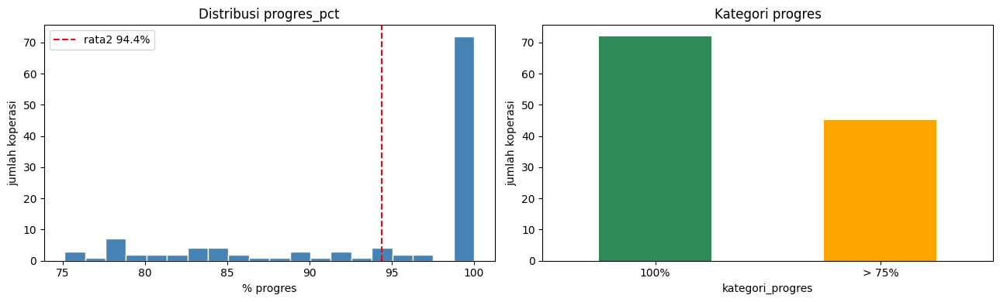

In [ ]:
# =========================================================
# EDA 2 — Distribusi progres
# =========================================================
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].hist(kop['progres_pct'], bins=20, color='steelblue', edgecolor='white')
ax[0].axvline(kop['progres_pct'].mean(), color='red', ls='--',
              label=f"rata2 {kop['progres_pct'].mean():.1f}%")
ax[0].set(title='Distribusi progres_pct', xlabel='% progres', ylabel='jumlah koperasi')
ax[0].legend()
kop['kategori_progres'].value_counts().plot.bar(ax=ax[1], color=['seagreen', 'orange'])
ax[1].set(title='Kategori progres', ylabel='jumlah koperasi')
ax[1].tick_params(axis='x', rotation=0)
plt.tight_layout(); plt.show()

Gambar kiri — Distribusi progres (%): Mayoritas koperasi sudah hampir/sepenuhnya rampung. Terlihat lonjakan tajam di 100% (~72 koperasi), sementara sisanya tersebar tipis di rentang 75–97%. Garis putus-putus merah menunjukkan rata-rata progres 94,4% — angka yang sangat tinggi, dan distribusinya menjulur ke kiri (left-skewed): pusat data tertarik ke kanan oleh dominasi yang sudah 100%, dengan ekor kecil koperasi yang tertinggal.
Gambar kanan — Kategori progres: Dari 117 koperasi, 72 sudah 100% (hijau) dan 45 masih di atas 75% tapi belum tuntas (oranye). Artinya ~62% selesai penuh, sisanya ~38% tinggal finalisasi.

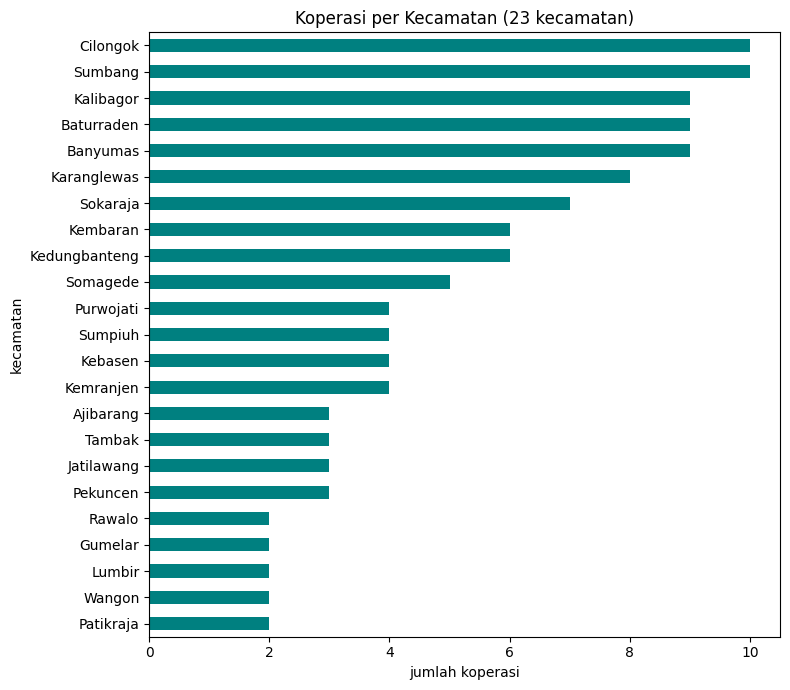

Tertinggi: {'Cilongok': 10, 'Sumbang': 10, 'Kalibagor': 9}
Terendah : {'Wangon': 2, 'Rawalo': 2, 'Patikraja': 2}


In [ ]:
# =========================================================
# EDA 3 — Jumlah koperasi per kecamatan
# =========================================================
vc = kop['kecamatan'].value_counts()
fig, ax = plt.subplots(figsize=(8, 7))
vc.sort_values().plot.barh(ax=ax, color='teal')
ax.set(title=f'Koperasi per Kecamatan ({kop["kecamatan"].nunique()} kecamatan)',
       xlabel='jumlah koperasi')
plt.tight_layout(); plt.show()
print('Tertinggi:', vc.head(3).to_dict())
print('Terendah :', vc.tail(3).to_dict())

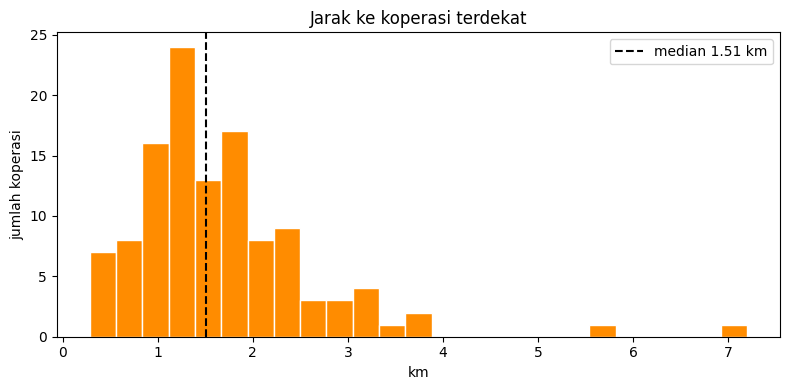

Spacing antar koperasi (km): min 0.28 | median 1.51 | maks 7.20


In [ ]:
# =========================================================
# EDA 4 — Nearest-neighbor distance antar koperasi (UTM, meter)
# =========================================================
coords = np.c_[g_kop.geometry.x, g_kop.geometry.y]
dist, _ = cKDTree(coords).query(coords, k=2)   # k=2: [0]=diri sendiri, [1]=tetangga terdekat
nn_km = dist[:, 1] / 1000

fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(nn_km, bins=25, color='darkorange', edgecolor='white')
ax.axvline(np.median(nn_km), color='black', ls='--',
           label=f'median {np.median(nn_km):.2f} km')
ax.set(title='Jarak ke koperasi terdekat', xlabel='km', ylabel='jumlah koperasi')
ax.legend(); plt.tight_layout(); plt.show()
print(f'Spacing antar koperasi (km): min {nn_km.min():.2f} | '
      f'median {np.median(nn_km):.2f} | maks {nn_km.max():.2f}')

 koperasi saling berdekatan. Median 1,51 km dengan puncak distribusi di ~1–2 km. Artinya, dari satu koperasi ke koperasi terdekat berikutnya umumnya cukup dekat — menandakan sebaran yang relatif rapat di sebagian besar wilayah, konsisten dengan konsentrasi di koridor tengah–timur pada peta sebelumnya.
Distribusi menjulur ke kanan (right-skewed). Mayoritas di bawah 3 km, tapi ada ekor panjang sampai ~5,6 dan ~7 km. Beberapa koperasi yang sangat terisolasi ini hampir pasti berada di wilayah barat/pinggiran yang jarang penduduknya.

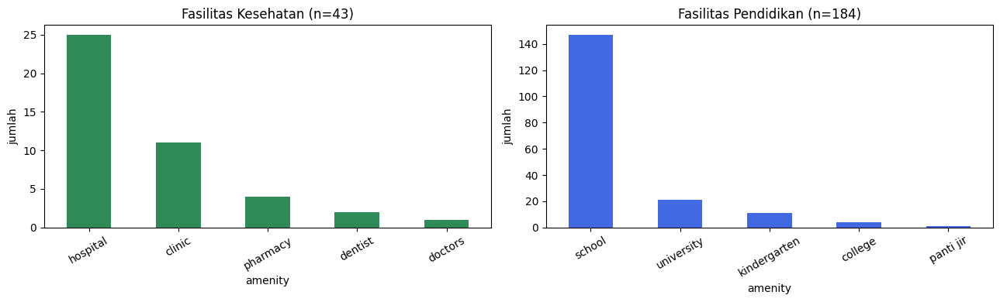

In [ ]:
# =========================================================
# EDA 5 — Breakdown fasilitas kesehatan & pendidikan
# =========================================================
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
g_health['amenity'].value_counts().plot.bar(ax=ax[0], color='seagreen')
ax[0].set(title=f'Fasilitas Kesehatan (n={len(g_health)})', ylabel='jumlah')
g_edu['amenity'].value_counts().plot.bar(ax=ax[1], color='royalblue')
ax[1].set(title=f'Fasilitas Pendidikan (n={len(g_edu)})', ylabel='jumlah')
for a in ax: a.tick_params(axis='x', rotation=30)
plt.tight_layout(); plt.show()

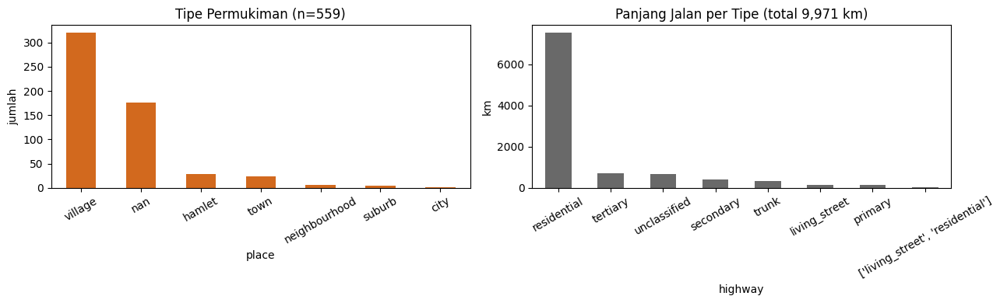

In [ ]:
# =========================================================
# EDA 6 — Tipe permukiman & jaringan jalan
# =========================================================
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
g_perm['place'].value_counts(dropna=False).plot.bar(ax=ax[0], color='chocolate')
ax[0].set(title=f'Tipe Permukiman (n={len(g_perm)})', ylabel='jumlah')

# Panjang jalan (km) per tipe highway
g_road['length'] = pd.to_numeric(g_road['length'], errors='coerce')
panjang = g_road.groupby('highway')['length'].sum().div(1000).sort_values(ascending=False).head(8)
panjang.plot.bar(ax=ax[1], color='dimgray')
ax[1].set(title=f'Panjang Jalan per Tipe (total {g_road["length"].sum()/1000:,.0f} km)',
          ylabel='km')
for a in ax: a.tick_params(axis='x', rotation=30)
plt.tight_layout(); plt.show()

Kiri — Tipe Permukiman (n=559): Sangat didominasi village/desa (~320), diikuti nan (~175), lalu hamlet, town, neighbourhood, suburb, dan city (sangat sedikit). Ini menegaskan karakter Banyumas yang dominan pedesaan — sesuai konteks program Koperasi Desa Merah Putih. Catatan penting: "nan" itu bukan tipe permukiman, melainkan data kosong (NaN) — ada ~175 titik yang tipenya tidak terisi di OSM.


Kanan — Panjang Jalan per Tipe (total 9.971 km): Didominasi sangat besar oleh residential (~7.500 km), jauh di atas tertiary, unclassified, secondary, trunk, dst. Artinya jaringan jalan Banyumas mayoritas jalan lingkungan/permukiman, sementara jalan arteri besar (trunk/primary) porsinya kecil — wajar untuk wilayah berbasis desa. Label terakhir ['living_street','residential'] adalah data dengan tag ganda (kurang rapi).

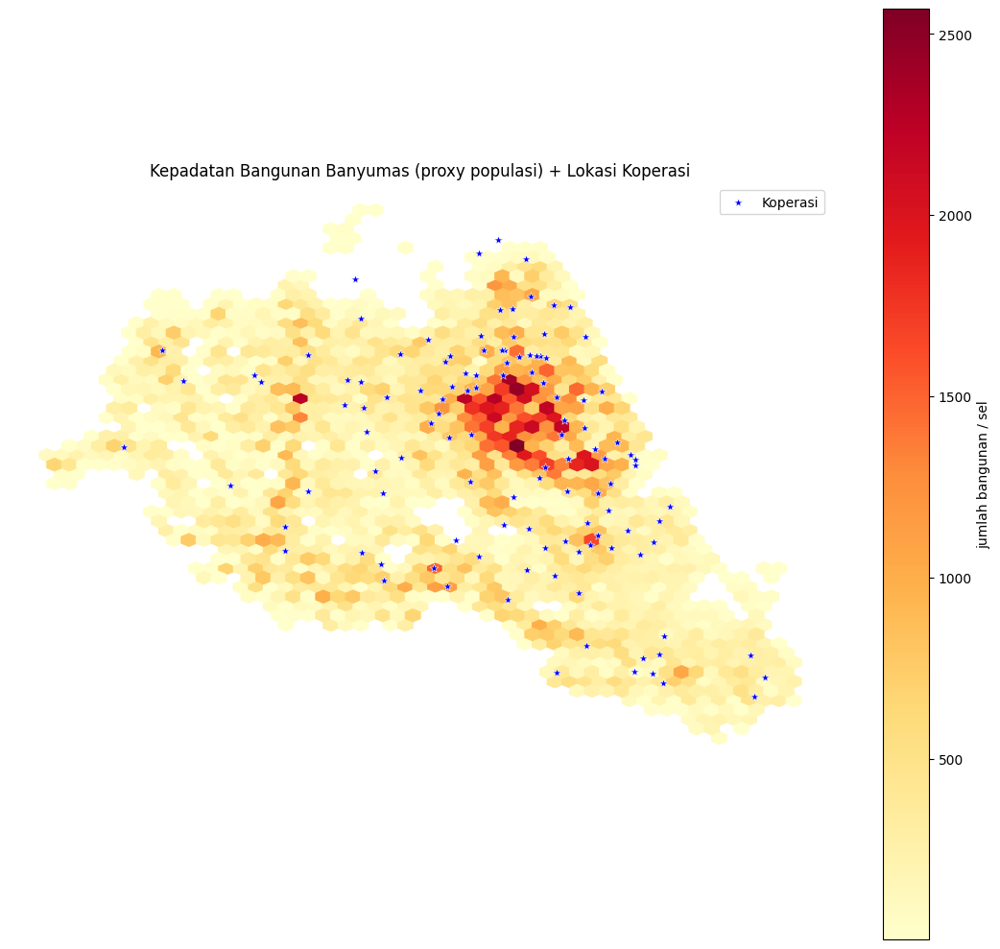

In [ ]:
# =========================================================
# EDA 7 — Hexbin kepadatan bangunan + overlay koperasi
# =========================================================
fig, ax = plt.subplots(figsize=(11, 10))
hb = ax.hexbin(g_bld.geometry.centroid.x, g_bld.geometry.centroid.y, gridsize=50,
               cmap='YlOrRd', mincnt=1)
ax.scatter(g_kop.geometry.x, g_kop.geometry.y, c='blue', s=45, marker='*',
           edgecolor='white', linewidth=0.4, label='Koperasi', zorder=5)
fig.colorbar(hb, ax=ax, label='jumlah bangunan / sel')
ax.set(title='Kepadatan Bangunan Banyumas (proxy populasi) + Lokasi Koperasi')
ax.set_aspect('equal'); ax.legend(); ax.set_axis_off()
plt.tight_layout(); plt.show()

Pola utama — satu inti padat di tengah-timur: Ada klaster merah pekat yang sangat menonjol di bagian tengah-timur (area perkotaan Purwokerto dan sekitarnya). Sisanya didominasi warna kuning muda — kepadatan rendah, khas pedesaan — yang menegaskan lagi karakter Banyumas sebagai wilayah dominan desa.
Koperasi mengikuti kepadatan: Bintang biru menumpuk di sekitar inti merah dan menipis ke barat/selatan yang kuning pucat. Ini mengonfirmasi temuan peta sebaran sebelumnya: koperasi tumbuh mengikuti pusat populasi/permukiman.

In [ ]:
# =========================================================
# EDA 8 — Konteks tiap koperasi: jarak fasilitas & kepadatan sekitar
# =========================================================
def nearest_dist(left, right, name):
    j = gpd.sjoin_nearest(left[['geometry']], right[['geometry']], distance_col=name)
    return j.groupby(j.index)[name].min()

main_road = g_road[g_road['highway'].astype(str)
                   .str.contains('motorway|trunk|primary|secondary')]

ctx = pd.DataFrame(index=g_kop.index)
ctx['jarak_kesehatan_m'] = nearest_dist(g_kop, g_health, 'd')
ctx['jarak_pendidikan_m'] = nearest_dist(g_kop, g_edu, 'd')
ctx['jarak_jalan_utama_m'] = nearest_dist(g_kop, main_road, 'd')

# Kepadatan: jumlah bangunan dalam radius 1 km
buf = g_kop[['geometry']].copy(); buf['geometry'] = buf.buffer(1000)
hit = gpd.sjoin(g_bld[['geometry']], buf, predicate='within')
ctx['bangunan_radius_1km'] = hit.groupby('index_right').size().reindex(g_kop.index).fillna(0).astype(int)

ctx['kecamatan'] = kop['kecamatan'].values
ctx['nama_koperasi'] = kop['nama_koperasi'].values
print('Ringkasan konteks spasial koperasi:')
print(ctx.drop(columns='kecamatan').describe().round(1))
print(ctx.drop(columns='nama_koperasi').describe().round(1))
print('\nContoh 5 koperasi:')
print(ctx.head(5).to_string())

Ringkasan konteks spasial koperasi:
       jarak_kesehatan_m  jarak_pendidikan_m  jarak_jalan_utama_m  \
count              117.0               117.0                117.0   
mean              4745.6              3179.0               1010.9   
std               3461.8              3315.2               1039.3   
min                392.2                15.4                  1.0   
25%               2230.0              1119.5                244.5   
50%               3870.4              1896.7                703.6   
75%               6347.3              3850.6               1612.8   
max              16812.4             17110.2               5779.1   

       bangunan_radius_1km  
count                117.0  
mean                1662.5  
std                 1111.7  
min                    0.0  
25%                  862.0  
50%                 1409.0  
75%                 2004.0  
max                 5788.0  
       jarak_kesehatan_m  jarak_pendidikan_m  jarak_jalan_utama_m  \
count       

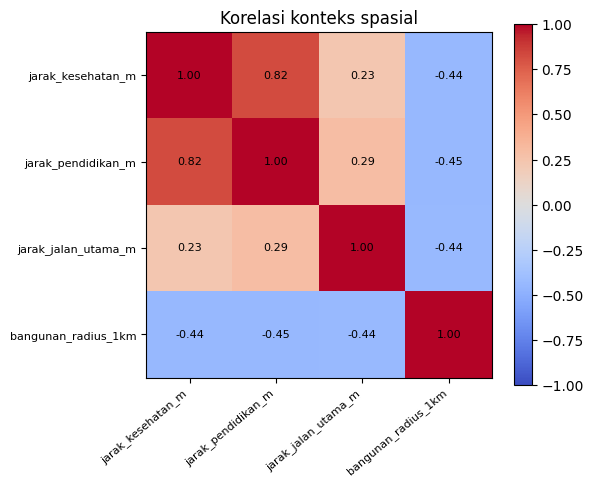

In [ ]:
# Korelasi antar variabel konteks
cols = ['jarak_kesehatan_m', 'jarak_pendidikan_m', 'jarak_jalan_utama_m', 'bangunan_radius_1km']
corr = ctx[cols].corr()
fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(corr, cmap='coolwarm', vmin=-1, vmax=1)
ax.set_xticks(range(len(cols))); ax.set_xticklabels(cols, rotation=40, ha='right', fontsize=8)
ax.set_yticks(range(len(cols))); ax.set_yticklabels(cols, fontsize=8)
for i in range(len(cols)):
    for j in range(len(cols)):
        ax.text(j, i, f'{corr.iloc[i, j]:.2f}', ha='center', va='center', fontsize=8)
fig.colorbar(im, ax=ax); ax.set_title('Korelasi konteks spasial')
plt.tight_layout(); plt.show()

In [ ]:
# =========================================================
# EDA 9 — Ringkasan temuan EDA
# =========================================================
print('RINGKASAN EDA — KDMP BANYUMAS')
print('-' * 50)
print(f'Koperasi                 : {len(kop)} di {kop["kecamatan"].nunique()} kecamatan')
print(f'Progres rata-rata        : {kop["progres_pct"].mean():.1f}%  '
      f'(belum 100%: {(kop["progres_pct"]<100).sum()} koperasi)')
print(f'Spacing antar koperasi   : median {np.median(nn_km):.2f} km')
print(f'Jarak ke jalan utama     : median {ctx["jarak_jalan_utama_m"].median():.0f} m')
print(f'Jarak ke faskes terdekat : median {ctx["jarak_kesehatan_m"].median():.0f} m')
print(f'Bangunan dlm radius 1 km : median {ctx["bangunan_radius_1km"].median():.0f}')
print(f'\nKoperasi paling "terisolasi" (faskes terjauh):')
print(ctx.nlargest(3, "jarak_kesehatan_m")[["kecamatan", "jarak_kesehatan_m"]].to_string())

RINGKASAN EDA — KDMP BANYUMAS
--------------------------------------------------
Koperasi                 : 117 di 23 kecamatan
Progres rata-rata        : 94.4%  (belum 100%: 45 koperasi)
Spacing antar koperasi   : median 1.51 km
Jarak ke jalan utama     : median 704 m
Jarak ke faskes terdekat : median 3870 m
Bangunan dlm radius 1 km : median 1409

Koperasi paling "terisolasi" (faskes terjauh):
   kecamatan  jarak_kesehatan_m
9     Tambak       16812.425611
66    Tambak       16521.555049
90    Tambak       14567.315574


In [ ]:
# =========================================================
# TAHAP 3A — Load & reproyeksi semua layer
# =========================================================
import os
import pandas as pd
import geopandas as gpd

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS = 'EPSG:4326'
UTM = 'EPSG:32749'          # UTM Zone 49S (meter) — CRS analisis

def load_osm_csv(name, crs_in=WGS, crs_out=UTM):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    geom = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns=['geometry']), geometry=geom, crs=crs_in)
    gdf = gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].copy()
    return gdf.to_crs(crs_out)

g_health = load_osm_csv('osm_kesehatan.csv')
g_edu    = load_osm_csv('osm_pendidikan.csv')
g_perm   = load_osm_csv('osm_permukiman.csv')
g_bld    = load_osm_csv('osm_bangunan.csv')
g_road   = load_osm_csv('osm_jalan_edges.csv')

# Koperasi & boundary (pakai gpkg Tahap 1; fallback bila tidak ada)
kop_gpkg = os.path.join(DATA_DIR, 'koperasi.gpkg')
if os.path.exists(kop_gpkg):
    g_kop = gpd.read_file(kop_gpkg)
else:
    dfk = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
    g_kop = gpd.GeoDataFrame(dfk, geometry=gpd.points_from_xy(dfk.longitude, dfk.latitude), crs=WGS)
g_kop = g_kop.to_crs(UTM)

bnd_gpkg = os.path.join(DATA_DIR, 'banyumas_boundary.gpkg')
if os.path.exists(bnd_gpkg):
    g_bnd = gpd.read_file(bnd_gpkg)
else:
    import osmnx as ox
    g_bnd = ox.geocode_to_gdf('Kabupaten Banyumas, Jawa Tengah, Indonesia')
g_bnd = g_bnd.to_crs(UTM)

print('Semua layer terbaca & direproyeksi ke', UTM)

Semua layer terbaca & direproyeksi ke EPSG:32749


In [ ]:
# =========================================================
# TAHAP 3B — Validasi geometri & ringkasan
# =========================================================
layers = {
    'Kesehatan' : g_health,
    'Pendidikan': g_edu,
    'Permukiman': g_perm,
    'Bangunan'  : g_bld,
    'Jalan'     : g_road,
    'Koperasi'  : g_kop,
    'Boundary'  : g_bnd,
}

print(f"{'Layer':<11}{'N':>9}  {'EPSG':<7} GeomType (invalid)")
print('-' * 58)
for nama, g in layers.items():
    n_invalid = int((~g.geometry.is_valid).sum())
    gtypes = ', '.join(sorted(g.geometry.geom_type.unique()))
    print(f"{nama:<11}{len(g):>9,}  {str(g.crs.to_epsg()):<7} {gtypes}  (invalid: {n_invalid})")

Layer              N  EPSG    GeomType (invalid)
----------------------------------------------------------
Kesehatan         43  32749   Point, Polygon  (invalid: 0)
Pendidikan       184  32749   Point, Polygon  (invalid: 0)
Permukiman       559  32749   Point, Polygon  (invalid: 0)
Bangunan     481,051  32749   MultiPolygon, Point, Polygon  (invalid: 0)
Jalan         84,879  32749   LineString  (invalid: 0)
Koperasi         117  32749   Point  (invalid: 0)
Boundary           1  32749   Polygon  (invalid: 0)


In [ ]:
# =========================================================
# TAHAP 3C — Pastikan titik berada di dalam boundary Banyumas
# =========================================================
bpoly = g_bnd.geometry.iloc[0]   # (multi)polygon Banyumas dalam UTM

def clip_points(gdf, poly):
    mask = gdf.within(poly)
    return gdf[mask].copy(), int((~mask).sum())

g_health, out_h = clip_points(g_health, bpoly)
g_edu,    out_e = clip_points(g_edu,    bpoly)
g_perm,   out_p = clip_points(g_perm,   bpoly)
g_bld,    out_b = clip_points(g_bld,    bpoly)

for nama, g, n_out in [('Kesehatan', g_health, out_h), ('Pendidikan', g_edu, out_e),
                       ('Permukiman', g_perm, out_p), ('Bangunan', g_bld, out_b)]:
    print(f"{nama:<11}: {len(g):>7,} di dalam | {n_out:>5,} di luar (dibuang)")

Kesehatan  :      43 di dalam |     0 di luar (dibuang)
Pendidikan :     184 di dalam |     0 di luar (dibuang)
Permukiman :     555 di dalam |     4 di luar (dibuang)
Bangunan   : 480,949 di dalam |   102 di luar (dibuang)


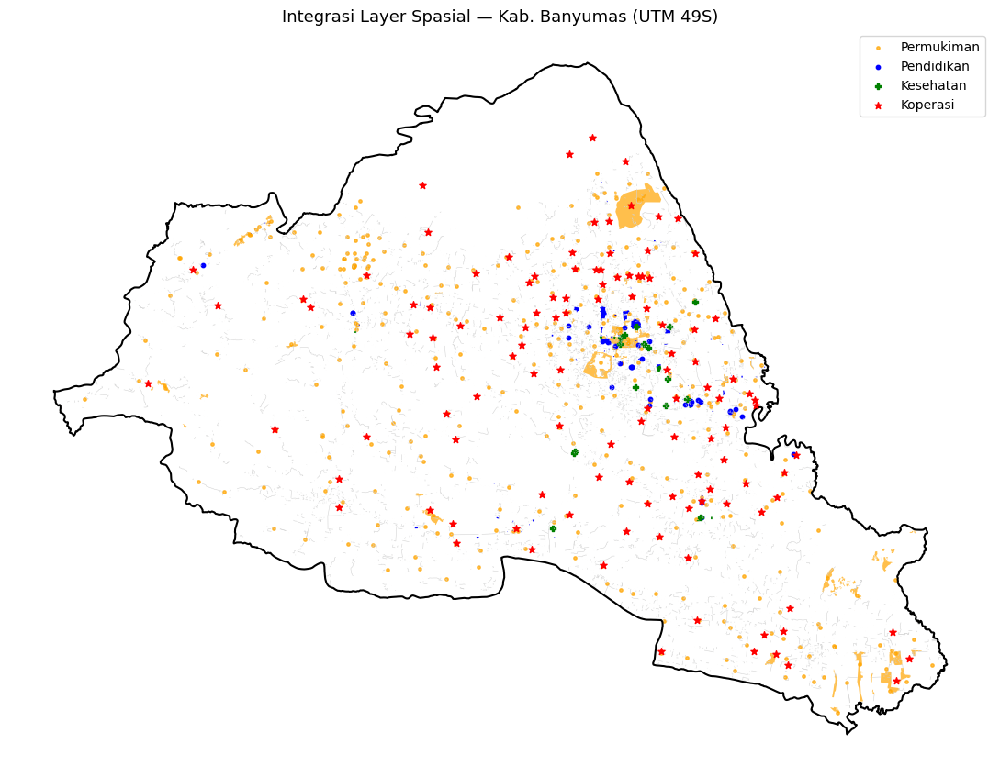

In [ ]:
# =========================================================
# TAHAP 3D — Peta cek integrasi (bangunan & jalan disampel agar ringan)
# =========================================================
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(11, 11))
g_bnd.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5, zorder=5)
g_road.sample(min(8000, len(g_road)), random_state=1).plot(ax=ax, color='lightgray', linewidth=0.4)
g_bld.sample(min(8000, len(g_bld)), random_state=1).plot(ax=ax, color='tan', markersize=1, alpha=0.4)
g_perm.plot(ax=ax, color='orange', markersize=6, alpha=0.7, label='Permukiman')
g_edu.plot(ax=ax, color='blue', markersize=10, label='Pendidikan')
g_health.plot(ax=ax, color='green', markersize=14, marker='P', label='Kesehatan')
g_kop.plot(ax=ax, color='red', markersize=30, marker='*', label='Koperasi', zorder=6)
ax.set_title('Integrasi Layer Spasial — Kab. Banyumas (UTM 49S)', fontsize=13)
ax.legend(loc='upper right'); ax.set_axis_off()
plt.tight_layout(); plt.show()

Ini adalah peta "semua bahan baku jadi satu" — menggabungkan seluruh layer spasial yang dipakai dalam analisis ke atas batas administrasi Banyumas, diproyeksikan dalam UTM 49S (satuan meter). Empat layer: permukiman (titik oranye), pendidikan (biru), kesehatan (hijau +), dan koperasi (bintang merah). Patch oranye besar = area permukiman padat (poligon, bukan sekadar titik).

In [ ]:
# =========================================================
# TAHAP 3E — Seragamkan fasilitas ke TITIK (centroid)
# Data OSM campuran Point/Polygon/MultiPolygon -> jadikan titik
# agar proximity & point-density per heksagon konsisten.
# (centroid dihitung di UTM, jadi akurat dalam meter)
# =========================================================
def to_points(gdf):
    g = gdf.copy()
    g['geometry'] = g.geometry.centroid
    return g

g_health = to_points(g_health)
g_edu    = to_points(g_edu)
g_perm   = to_points(g_perm)
g_bld    = to_points(g_bld)

for nama, g in [('Kesehatan', g_health), ('Pendidikan', g_edu),
                ('Permukiman', g_perm), ('Bangunan', g_bld)]:
    tipe = ', '.join(g.geometry.geom_type.unique())
    print(f"{nama:<11}: {len(g):>7,} | tipe geometri: {tipe}")

print('\nJalan    :', g_road.geometry.geom_type.unique(), '(tetap garis)')
print('Boundary :', g_bnd.geometry.geom_type.unique(), '(tetap poligon)')

Kesehatan  :      43 | tipe geometri: Point
Pendidikan :     184 | tipe geometri: Point
Permukiman :     555 | tipe geometri: Point
Bangunan   : 480,949 | tipe geometri: Point

Jalan    : ['LineString'] (tetap garis)
Boundary : ['Polygon'] (tetap poligon)


In [ ]:
# =========================================================
# TAHAP 4A — Setup H3
# =========================================================
import os, h3
import numpy as np, pandas as pd, geopandas as gpd
from shapely.geometry import Polygon
import matplotlib.pyplot as plt

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'
RES = 8                       # resolusi H3 (≈0,74 km²/heksagon)

print('h3 version:', h3.__version__)

# Reload boundary & koperasi (ringan)
g_bnd = gpd.read_file(os.path.join(DATA_DIR, 'banyumas_boundary.gpkg')).to_crs(UTM)
kop_gpkg = os.path.join(DATA_DIR, 'koperasi.gpkg')
if os.path.exists(kop_gpkg):
    g_kop = gpd.read_file(kop_gpkg)
else:
    dfk = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
    g_kop = gpd.GeoDataFrame(dfk, geometry=gpd.points_from_xy(dfk.longitude, dfk.latitude), crs=WGS)
g_kop = g_kop.to_crs(UTM)
print('Boundary & koperasi siap.')

h3 version: 4.5.0
Boundary & koperasi siap.


In [ ]:
# =========================================================
# TAHAP 4B — Polyfill boundary -> sel H3
# =========================================================
bnd_wgs = g_bnd.to_crs(WGS).geometry.iloc[0]      # H3 bekerja di WGS84 (lat/lng)

def boundary_to_cells(geom_wgs, res):
    # Coba API ringkas geo_to_cells; fallback ke LatLngPoly manual
    try:
        return set(h3.geo_to_cells(geom_wgs, res))
    except Exception:
        cells = set()
        polys = geom_wgs.geoms if geom_wgs.geom_type == 'MultiPolygon' else [geom_wgs]
        for poly in polys:
            outer = [(lat, lng) for lng, lat in poly.exterior.coords]      # (lat, lng)
            holes = [[(lat, lng) for lng, lat in r.coords] for r in poly.interiors]
            shape = h3.LatLngPoly(outer, *holes)
            fn = getattr(h3, 'polygon_to_cells', None) or h3.h3shape_to_cells
            cells |= set(fn(shape, res))
        return cells

# H3 index tiap koperasi (untuk dijamin masuk grid)
g_kop['h3_index'] = [h3.latlng_to_cell(p.y, p.x, RES) for p in g_kop.to_crs(WGS).geometry]

cells = boundary_to_cells(bnd_wgs, RES) | set(g_kop['h3_index'])   # gabung agar tiap koperasi punya sel
cells = sorted(cells)
print(f'Resolusi H3   : {RES}')
print(f'Jumlah heksagon: {len(cells):,}  (perkiraan ~1.900)')

Resolusi H3   : 8
Jumlah heksagon: 1,954  (perkiraan ~1.900)


In [ ]:
# =========================================================
# TAHAP 4C — GeoDataFrame heksagon + jumlah koperasi per sel
# =========================================================
def cell_to_polygon(cell):
    b = h3.cell_to_boundary(cell)              # tuple (lat, lng)
    return Polygon([(lng, lat) for lat, lng in b])

gdf_hex = gpd.GeoDataFrame(
    {'h3_index': cells},
    geometry=[cell_to_polygon(c) for c in cells],
    crs=WGS
).to_crs(UTM)

# Jumlah koperasi per heksagon
kop_per_hex = g_kop['h3_index'].value_counts()
gdf_hex['n_koperasi'] = gdf_hex['h3_index'].map(kop_per_hex).fillna(0).astype(int)

luas_km2 = gdf_hex.geometry.area / 1e6
print(f'Luas heksagon (km²): min {luas_km2.min():.3f} | '
      f'rata2 {luas_km2.mean():.3f} | maks {luas_km2.max():.3f}')
print(f'Heksagon berisi koperasi : {(gdf_hex.n_koperasi > 0).sum()}')
print(f'Maks koperasi/heksagon   : {gdf_hex.n_koperasi.max()}')
print(f'Total koperasi tercakup  : {gdf_hex.n_koperasi.sum()}  (harus 117)')

Luas heksagon (km²): min 0.707 | rata2 0.711 | maks 0.715
Heksagon berisi koperasi : 116
Maks koperasi/heksagon   : 2
Total koperasi tercakup  : 117  (harus 117)


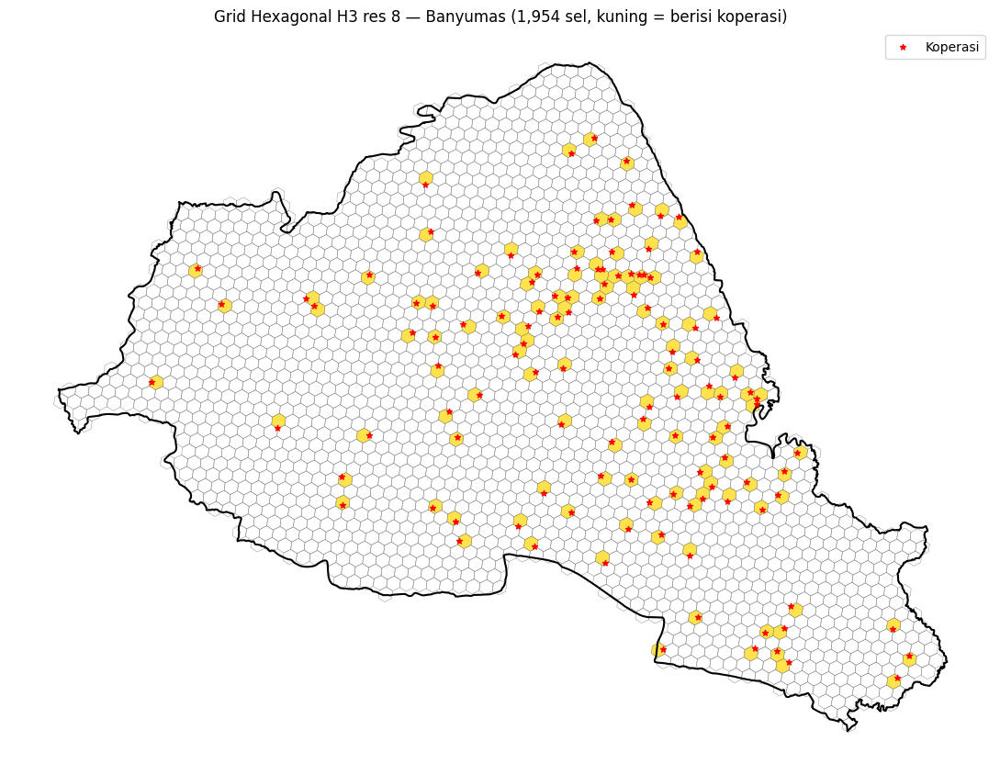


Grid disimpan: grid_h3_res8.csv (1,954 heksagon)


In [ ]:
# =========================================================
# TAHAP 4D — Visualisasi grid + simpan untuk Tahap 5
# =========================================================
fig, ax = plt.subplots(figsize=(11, 11))
gdf_hex.plot(ax=ax, facecolor='none', edgecolor='gray', linewidth=0.3)
gdf_hex[gdf_hex.n_koperasi > 0].plot(ax=ax, color='gold', edgecolor='gray',
                                     linewidth=0.3, alpha=0.7)
g_bnd.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5, zorder=4)
g_kop.plot(ax=ax, color='red', markersize=20, marker='*', zorder=5, label='Koperasi')
ax.set_title(f'Grid Hexagonal H3 res {RES} — Banyumas '
             f'({len(gdf_hex):,} sel, kuning = berisi koperasi)', fontsize=12)
ax.legend(); ax.set_axis_off()
plt.tight_layout(); plt.show()

# Simpan grid (kecil) sbg CSV-WKT agar reload konsisten di tahap berikutnya
out = gdf_hex.to_crs(WGS).copy()
out['geometry'] = out.geometry.to_wkt()
out.to_csv(os.path.join(DATA_DIR, f'grid_h3_res{RES}.csv'))
print(f'\nGrid disimpan: grid_h3_res{RES}.csv ({len(gdf_hex):,} heksagon)')

Seluruh wilayah Banyumas dibagi menjadi 1.954 sel heksagon seragam (H3 resolusi 8, masing-masing ~0,7 km²). Setiap heksagon adalah unit analisis standar. Heksagon kuning = sel yang berisi minimal satu koperasi (bintang merah); heksagon abu-abu/kosong = belum ada koperasi.


In [ ]:
# =========================================================
# TAHAP 5A — Load grid + fitur (UTM)
# =========================================================
import os, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)

# Grid heksagon
gdf_hex = load_csv_utm('grid_h3_res8.csv')

# Fasilitas -> titik (centroid); jalan tetap garis
g_health = load_csv_utm('osm_kesehatan.csv');  g_health['geometry'] = g_health.geometry.centroid
g_edu    = load_csv_utm('osm_pendidikan.csv'); g_edu['geometry']    = g_edu.geometry.centroid
g_bld    = load_csv_utm('osm_bangunan.csv');   g_bld['geometry']    = g_bld.geometry.centroid
g_road   = load_csv_utm('osm_jalan_edges.csv')

print(f'Heksagon {len(gdf_hex):,} | kesehatan {len(g_health)} | pendidikan {len(g_edu)} | '
      f'bangunan {len(g_bld):,} | ruas jalan {len(g_road):,}')

Heksagon 1,954 | kesehatan 43 | pendidikan 184 | bangunan 481,051 | ruas jalan 84,879


In [ ]:
# =========================================================
# TAHAP 5B — n_bangunan per heksagon + sel "padat"
# =========================================================
DENSE_Q = 0.85   # heksagon di kuantil >=85% bangunan dianggap padat (bisa disetel)

bld_join = gpd.sjoin(g_bld[['geometry']], gdf_hex[['h3_index', 'geometry']], predicate='within')
n_bld = bld_join.groupby('h3_index').size()
gdf_hex['n_bangunan'] = gdf_hex['h3_index'].map(n_bld).fillna(0).astype(int)

thr = gdf_hex['n_bangunan'].quantile(DENSE_Q)
dense = gdf_hex[gdf_hex['n_bangunan'] >= thr].copy()
dense['geometry'] = dense.geometry.centroid   # titik referensi sel padat

print(f'Bangunan/heksagon : median {gdf_hex.n_bangunan.median():.0f} | '
      f'maks {gdf_hex.n_bangunan.max():,}')
print(f'Ambang "padat" (≥{DENSE_Q:.0%}): {thr:.0f} bangunan')
print(f'Heksagon permukiman padat: {len(dense)}')

Bangunan/heksagon : median 161 | maks 2,088
Ambang "padat" (≥85%): 478 bangunan
Heksagon permukiman padat: 295


In [ ]:
# =========================================================
# TAHAP 5C — Proximity: jarak ke fitur terdekat (meter)
# =========================================================
hex_cent = gdf_hex[['h3_index', 'geometry']].copy()
hex_cent['geometry'] = gdf_hex.geometry.centroid

def nearest_dist(src, target, col='d'):
    j = gpd.sjoin_nearest(src, target[['geometry']], distance_col=col)
    return j.groupby('h3_index')[col].min()

# Jalan utama = trunk/primary/secondary/motorway
main_road = g_road[g_road['highway'].astype(str)
                   .str.contains('motorway|trunk|primary|secondary', na=False)]
print('Ruas jalan utama:', len(main_road))

gdf_hex['dist_jalan_utama_m']     = gdf_hex['h3_index'].map(nearest_dist(hex_cent, main_road))
gdf_hex['dist_sekolah_m']         = gdf_hex['h3_index'].map(nearest_dist(hex_cent, g_edu))
gdf_hex['dist_kesehatan_m']       = gdf_hex['h3_index'].map(nearest_dist(hex_cent, g_health))
gdf_hex['dist_permukiman_padat_m']= gdf_hex['h3_index'].map(nearest_dist(hex_cent, dense))

prox = ['dist_jalan_utama_m', 'dist_sekolah_m', 'dist_kesehatan_m', 'dist_permukiman_padat_m']
print(gdf_hex[prox].describe().round(0))

Ruas jalan utama: 7193
       dist_jalan_utama_m  dist_sekolah_m  dist_kesehatan_m  \
count              1954.0          1954.0            1954.0   
mean               1704.0          5111.0            7121.0   
std                1616.0          3806.0            4332.0   
min                   1.0            22.0              42.0   
25%                 473.0          2145.0            3512.0   
50%                1200.0          4226.0            6650.0   
75%                2420.0          7227.0           10127.0   
max                9089.0         18366.0           21066.0   

       dist_permukiman_padat_m  
count                   1954.0  
mean                    2076.0  
std                     1923.0  
min                        0.0  
25%                      875.0  
50%                     1561.0  
75%                     2747.0  
max                    10460.0  


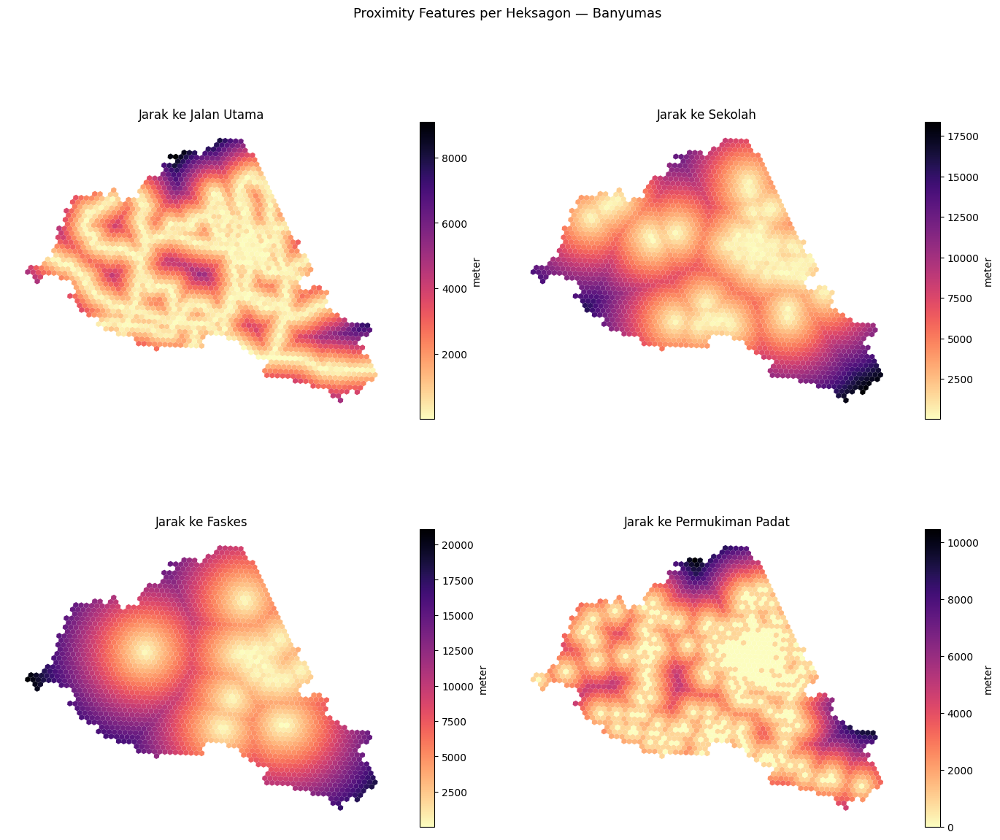

Disimpan: features_h3_res8.csv
Kolom: ['h3_index', 'n_koperasi', 'geometry', 'n_bangunan', 'dist_jalan_utama_m', 'dist_sekolah_m', 'dist_kesehatan_m', 'dist_permukiman_padat_m']


In [ ]:
# =========================================================
# TAHAP 5D — Peta 4 proximity feature + simpan
# =========================================================
judul = {
    'dist_jalan_utama_m'      : 'Jarak ke Jalan Utama',
    'dist_sekolah_m'          : 'Jarak ke Sekolah',
    'dist_kesehatan_m'        : 'Jarak ke Faskes',
    'dist_permukiman_padat_m' : 'Jarak ke Permukiman Padat',
}
fig, axes = plt.subplots(2, 2, figsize=(14, 13))
for ax, col in zip(axes.flat, prox):
    gdf_hex.plot(column=col, cmap='magma_r', legend=True, linewidth=0, ax=ax,
                 legend_kwds={'shrink': 0.6, 'label': 'meter'})
    ax.set_title(judul[col]); ax.set_axis_off()
plt.suptitle('Proximity Features per Heksagon — Banyumas', fontsize=13)
plt.tight_layout(); plt.show()

# Simpan feature set (termasuk n_bangunan utk Tahap 6)
out = gdf_hex.to_crs(WGS).copy()
out['geometry'] = out.geometry.to_wkt()
out.to_csv(os.path.join(DATA_DIR, 'features_h3_res8.csv'))
print('Disimpan: features_h3_res8.csv')
print('Kolom:', list(gdf_hex.columns))

In [ ]:
# =========================================================
# TAHAP 6A — Load grid (sudah ber-feature) + titik
# =========================================================
import os, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)

gdf_hex  = load_csv_utm('features_h3_res8.csv')         # punya n_bangunan, proximity, dst
g_perm   = load_csv_utm('osm_permukiman.csv'); g_perm['geometry']   = g_perm.geometry.centroid
g_health = load_csv_utm('osm_kesehatan.csv');  g_health['geometry'] = g_health.geometry.centroid
g_edu    = load_csv_utm('osm_pendidikan.csv'); g_edu['geometry']    = g_edu.geometry.centroid

print('Kolom grid saat ini:', list(gdf_hex.columns))

Kolom grid saat ini: ['h3_index', 'n_koperasi', 'n_bangunan', 'dist_jalan_utama_m', 'dist_sekolah_m', 'dist_kesehatan_m', 'dist_permukiman_padat_m', 'geometry']


In [ ]:
# =========================================================
# TAHAP 6B — Density features (point density / km²)
# =========================================================
def count_within(points, hexes):
    j = gpd.sjoin(points[['geometry']], hexes[['h3_index', 'geometry']], predicate='within')
    return j.groupby('h3_index').size()

gdf_hex['n_permukiman'] = gdf_hex['h3_index'].map(count_within(g_perm,   gdf_hex)).fillna(0).astype(int)
gdf_hex['n_kesehatan']  = gdf_hex['h3_index'].map(count_within(g_health, gdf_hex)).fillna(0).astype(int)
gdf_hex['n_pendidikan'] = gdf_hex['h3_index'].map(count_within(g_edu,    gdf_hex)).fillna(0).astype(int)
gdf_hex['n_fasilitas']  = gdf_hex['n_kesehatan'] + gdf_hex['n_pendidikan']   # fasilitas umum

# Normalisasi terhadap luas sel (km²) -> kepadatan setara antar heksagon
area_km2 = gdf_hex.geometry.area / 1e6
gdf_hex['dens_bangunan']   = gdf_hex['n_bangunan']   / area_km2
gdf_hex['dens_permukiman'] = gdf_hex['n_permukiman'] / area_km2
gdf_hex['dens_fasilitas']  = gdf_hex['n_fasilitas']  / area_km2

dens = ['dens_bangunan', 'dens_permukiman', 'dens_fasilitas']
print(gdf_hex[dens].describe().round(2))
print('\nTotal cek: permukiman', gdf_hex.n_permukiman.sum(),
      '| kesehatan', gdf_hex.n_kesehatan.sum(),
      '| pendidikan', gdf_hex.n_pendidikan.sum())

       dens_bangunan  dens_permukiman  dens_fasilitas
count        1954.00          1954.00         1954.00
mean          343.86             0.40            0.16
std           423.79             1.37            1.08
min             0.00             0.00            0.00
25%            40.82             0.00            0.00
50%           226.28             0.00            0.00
75%           470.05             0.00            0.00
max          2936.20            39.43           22.50

Total cek: permukiman 551 | kesehatan 43 | pendidikan 183


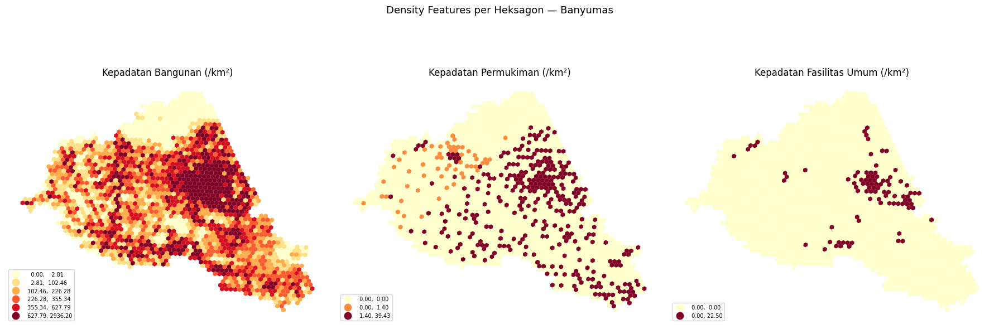

In [ ]:
# =========================================================
# TAHAP 6C — Peta kepadatan
# =========================================================
judul = {
    'dens_bangunan'  : 'Kepadatan Bangunan (/km²)',
    'dens_permukiman': 'Kepadatan Permukiman (/km²)',
    'dens_fasilitas' : 'Kepadatan Fasilitas Umum (/km²)',
}
fig, axes = plt.subplots(1, 3, figsize=(18, 7))
for ax, col in zip(axes, dens):
    # skala kuantil agar pola terlihat (data sangat skewed)
    gdf_hex.plot(column=col, cmap='YlOrRd', scheme='quantiles', k=6,
                 legend=True, linewidth=0, ax=ax,
                 legend_kwds={'fontsize': 7, 'loc': 'lower left'})
    ax.set_title(judul[col]); ax.set_axis_off()
plt.suptitle('Density Features per Heksagon — Banyumas', fontsize=13)
plt.tight_layout(); plt.show()

In [ ]:
# =========================================================
# TAHAP 6D — Simpan feature set (proximity + density)
# =========================================================
out = gdf_hex.to_crs(WGS).copy()
out['geometry'] = out.geometry.to_wkt()
out.to_csv(os.path.join(DATA_DIR, 'features_h3_res8.csv'))
print('Diperbarui: features_h3_res8.csv')
print('Kolom:', list(gdf_hex.columns))

Diperbarui: features_h3_res8.csv
Kolom: ['h3_index', 'n_koperasi', 'n_bangunan', 'dist_jalan_utama_m', 'dist_sekolah_m', 'dist_kesehatan_m', 'dist_permukiman_padat_m', 'geometry', 'n_permukiman', 'n_kesehatan', 'n_pendidikan', 'n_fasilitas', 'dens_bangunan', 'dens_permukiman', 'dens_fasilitas']


In [ ]:
# =========================================================
# TAHAP 7A — Load grid + fasilitas sekitar (H3 k-ring)
# =========================================================
import os, h3, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'
RES, K_RING = 8, 2          # k-ring 2 ≈ radius ±2 km

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)

gdf_hex = load_csv_utm('features_h3_res8.csv')

# Jumlah fasilitas umum dalam k-ring tiap heksagon
fac = gdf_hex.set_index('h3_index')['n_fasilitas'].to_dict()
gdf_hex['n_fasilitas_sekitar'] = gdf_hex['h3_index'].apply(
    lambda c: sum(fac.get(x, 0) for x in h3.grid_disk(c, K_RING))
)
print('Fasilitas sekitar (k=2): median', int(gdf_hex.n_fasilitas_sekitar.median()),
      '| maks', int(gdf_hex.n_fasilitas_sekitar.max()))

Fasilitas sekitar (k=2): median 0 | maks 88


In [ ]:
# =========================================================
# TAHAP 7B — Accessibility Index (0–1)
# =========================================================
def minmax(s):
    return (s - s.min()) / (s.max() - s.min())

# Bobot komponen (jumlahnya = 1; silakan disetel)
W = {'jalan': 1/3, 'fasilitas': 1/3, 'densitas': 1/3}

gdf_hex['acc_jalan']     = 1 - minmax(gdf_hex['dist_jalan_utama_m'])      # makin dekat = makin tinggi
gdf_hex['acc_fasilitas'] = minmax(np.log1p(gdf_hex['n_fasilitas_sekitar']))
gdf_hex['acc_densitas']  = minmax(np.log1p(gdf_hex['dens_bangunan']))

gdf_hex['accessibility_index'] = (
    W['jalan']     * gdf_hex['acc_jalan'] +
    W['fasilitas'] * gdf_hex['acc_fasilitas'] +
    W['densitas']  * gdf_hex['acc_densitas']
)

print(gdf_hex[['acc_jalan', 'acc_fasilitas', 'acc_densitas',
               'accessibility_index']].describe().round(3))

       acc_jalan  acc_fasilitas  acc_densitas  accessibility_index
count   1954.000       1954.000      1954.000             1954.000
mean       0.813          0.101         0.571                0.495
std        0.178          0.197         0.289                0.176
min        0.000          0.000         0.000                0.016
25%        0.734          0.000         0.468                0.408
50%        0.868          0.000         0.680                0.509
75%        0.948          0.154         0.771                0.593
max        1.000          1.000         1.000                0.979


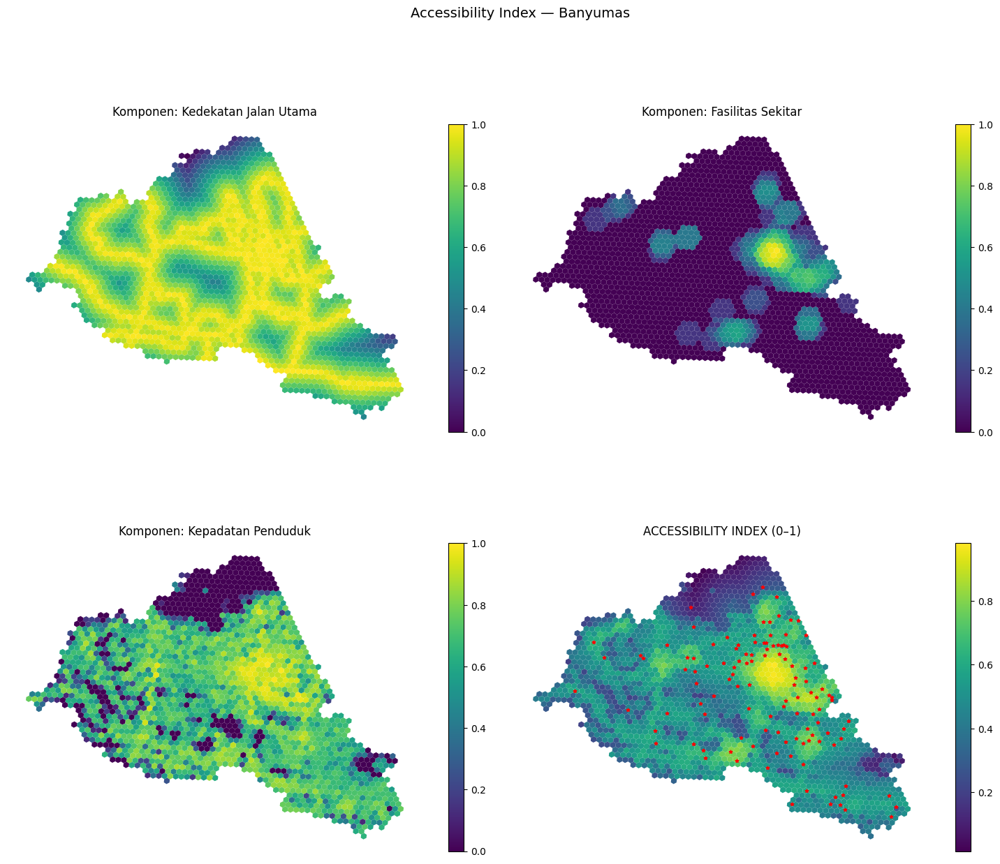

In [ ]:
# =========================================================
# TAHAP 7C (perbaikan) — Peta komponen + indeks akhir
# =========================================================
# Koperasi untuk overlay (dibaca dari CSV, lalu ke UTM)
kop_df = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
g_kop = gpd.GeoDataFrame(
    kop_df, geometry=gpd.points_from_xy(kop_df.longitude, kop_df.latitude), crs=WGS
).to_crs(UTM)

fig, axes = plt.subplots(2, 2, figsize=(15, 14))
peta = [('acc_jalan', 'Komponen: Kedekatan Jalan Utama'),
        ('acc_fasilitas', 'Komponen: Fasilitas Sekitar'),
        ('acc_densitas', 'Komponen: Kepadatan Penduduk'),
        ('accessibility_index', 'ACCESSIBILITY INDEX (0–1)')]
for ax, (col, judul) in zip(axes.flat, peta):
    gdf_hex.plot(column=col, cmap='viridis', legend=True, linewidth=0, ax=ax,
                 legend_kwds={'shrink': 0.6})
    if col == 'accessibility_index':
        g_kop.plot(ax=ax, color='red', markersize=12, marker='*', zorder=5)
    ax.set_title(judul); ax.set_axis_off()
plt.suptitle('Accessibility Index — Banyumas', fontsize=14)
plt.tight_layout(); plt.show()

In [ ]:
# =========================================================
# TAHAP 7D — Accessibility tiap koperasi + simpan
# =========================================================
kop = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
kop['h3_index'] = [h3.latlng_to_cell(la, lo, RES)
                   for la, lo in zip(kop['latitude'], kop['longitude'])]
idx_by_cell = gdf_hex.set_index('h3_index')['accessibility_index']
kop['accessibility'] = kop['h3_index'].map(idx_by_cell)

print('Accessibility koperasi: median', round(kop['accessibility'].median(), 3))
print('\n5 koperasi AKSESIBILITAS TERTINGGI:')
print(kop.nlargest(5, 'accessibility')[['nama_koperasi', 'kecamatan', 'accessibility']].to_string(index=False))
print('\n5 koperasi AKSESIBILITAS TERENDAH:')
print(kop.nsmallest(5, 'accessibility')[['nama_koperasi', 'kecamatan', 'accessibility']].to_string(index=False))

# Simpan
out = gdf_hex.to_crs(WGS).copy(); out['geometry'] = out.geometry.to_wkt()
out.to_csv(os.path.join(DATA_DIR, 'features_h3_res8.csv'))
print('\nDiperbarui: features_h3_res8.csv')
print('Kolom:', list(gdf_hex.columns))

Accessibility koperasi: median 0.597

5 koperasi AKSESIBILITAS TERTINGGI:
                                                                   nama_koperasi kecamatan  accessibility
    KOPERASI DESA MERAH PUTIH SOKARAJA LOR KECAMATAN SOKARAJA KABUPATEN BANYUMAS  Sokaraja       0.880256
  KOPERASI DESA MERAH PUTIH SOKARAJA WETAN KECAMATAN SOKARAJA KABUPATEN BANYUMAS  Sokaraja       0.834935
KOPERASI DESA MERAH PUTIH TAMBAKSARI KIDUL KECAMATAN KEMBARAN KABUPATEN BANYUMAS  Kembaran       0.829605
  KOPERASI DESA MERAH PUTIH KARANGKEDAWUNG KECAMATAN SOKARAJA KABUPATEN BANYUMAS  Sokaraja       0.822699
      KOPERASI DESA MERAH PUTIH DUKUHWALUH KECAMATAN KEMBARAN KABUPATEN BANYUMAS  Kembaran       0.812004

5 koperasi AKSESIBILITAS TERENDAH:
                                                                nama_koperasi  kecamatan  accessibility
     KOPERASI DESA MERAH PUTIH TUMIYANG KECAMATAN PEKUNCEN KABUPATEN BANYUMAS   Pekuncen       0.112620
   KOPERASI DESA MERAH PUTIH KETENGER KECAMATA

In [ ]:
# =========================================================
# TAHAP 8A — Siapkan & standardisasi feature matrix
# =========================================================
import os, h3, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM, RES = 'EPSG:4326', 'EPSG:32749', 8

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)

gdf_hex = load_csv_utm('features_h3_res8.csv')

feat_cols = ['dist_jalan_utama_m', 'dist_sekolah_m', 'dist_kesehatan_m', 'dist_permukiman_padat_m',
             'dens_bangunan', 'dens_permukiman', 'dens_fasilitas', 'n_fasilitas_sekitar']
X = gdf_hex[feat_cols].copy()
for c in ['dens_bangunan', 'dens_permukiman', 'dens_fasilitas', 'n_fasilitas_sekitar']:
    X[c] = np.log1p(X[c])      # tangani skew
Xs = StandardScaler().fit_transform(X)
print('Feature matrix:', Xs.shape)

Feature matrix: (1954, 8)


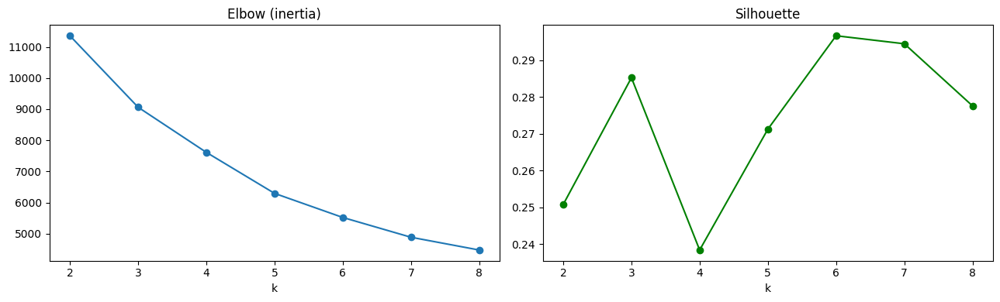

k=2: silhouette=0.251
k=3: silhouette=0.285
k=4: silhouette=0.238
k=5: silhouette=0.271
k=6: silhouette=0.297
k=7: silhouette=0.294
k=8: silhouette=0.278

Silhouette terbaik di k = 6


In [ ]:
# =========================================================
# TAHAP 8B — Tentukan k optimal
# =========================================================
ks = range(2, 9)
inertia, sil = [], []
for k in ks:
    km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(Xs)
    inertia.append(km.inertia_)
    sil.append(silhouette_score(Xs, km.labels_))

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].plot(list(ks), inertia, 'o-'); ax[0].set(title='Elbow (inertia)', xlabel='k')
ax[1].plot(list(ks), sil, 'o-', color='green'); ax[1].set(title='Silhouette', xlabel='k')
plt.tight_layout(); plt.show()

for k, s in zip(ks, sil):
    print(f'k={k}: silhouette={s:.3f}')
best_k = list(ks)[int(np.argmax(sil))]
print('\nSilhouette terbaik di k =', best_k)

In [ ]:
# =========================================================
# TAHAP 8C — Clustering + profil tipologi wilayah
# =========================================================
K = best_k       # ganti manual bila mau tipologi lebih kaya (mis. K = 5)
km = KMeans(n_clusters=K, random_state=42, n_init=10).fit(Xs)
gdf_hex['cluster'] = km.labels_

prof = gdf_hex.groupby('cluster')[feat_cols + ['accessibility_index', 'n_koperasi']].mean()
prof['n_hex'] = gdf_hex.groupby('cluster').size()
prof['n_koperasi_total'] = gdf_hex.groupby('cluster')['n_koperasi'].sum()
print('Profil rata-rata per cluster:\n')
print(prof.round(2).to_string())

Profil rata-rata per cluster:

         dist_jalan_utama_m  dist_sekolah_m  dist_kesehatan_m  dist_permukiman_padat_m  dens_bangunan  dens_permukiman  dens_fasilitas  n_fasilitas_sekitar  accessibility_index  n_koperasi  n_hex  n_koperasi_total
cluster                                                                                                                                                                                                              
0                    639.15         1358.21           2293.38                   613.97         700.07             0.46            0.03                 7.37                 0.70        0.11    281                32
1                   1721.94        11099.49          13347.93                  2221.44         192.25             0.14            0.00                 0.00                 0.44        0.02    324                 7
2                   1518.70         4018.55           6416.31                  1875.09         225.80            

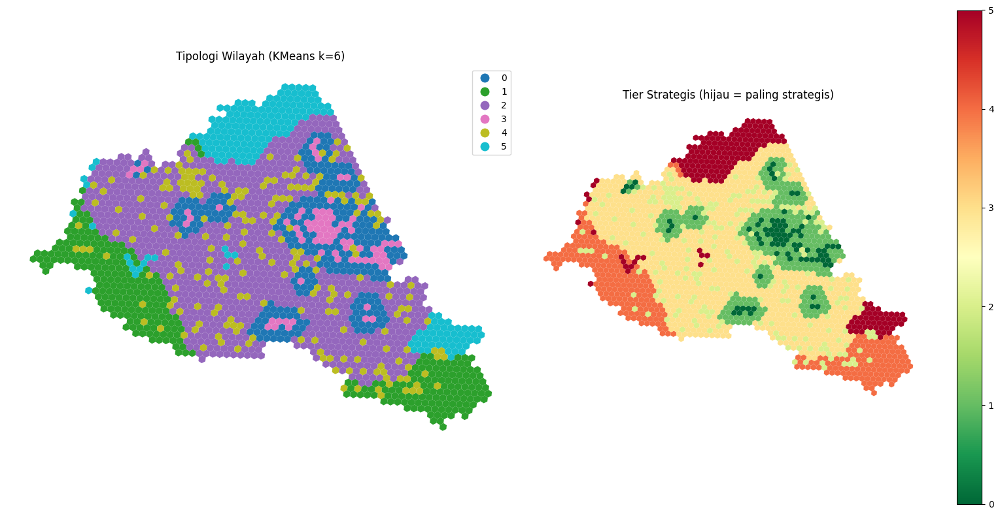

Sebaran heksagon per tier:
tier_strategis
Kurang Strategis    841
Pinggiran           324
Strategis           281
Sedang              218
Terpencil           210
Sangat Strategis     80
Name: count, dtype: int64


In [ ]:
# =========================================================
# TAHAP 8D — Urutkan cluster -> tier strategis
# =========================================================
order = prof['accessibility_index'].sort_values(ascending=False).index.tolist()  # cluster terstrategis dulu
labels = ['Sangat Strategis', 'Strategis', 'Sedang', 'Kurang Strategis', 'Pinggiran', 'Terpencil', 'Sangat Terpencil']
tier_map = {cl: labels[r] for r, cl in enumerate(order)}
rank_map = {cl: r for r, cl in enumerate(order)}      # 0 = paling strategis
gdf_hex['tier_strategis'] = gdf_hex['cluster'].map(tier_map)
gdf_hex['strategic_rank'] = gdf_hex['cluster'].map(rank_map)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
gdf_hex.plot(column='cluster', categorical=True, legend=True, cmap='tab10',
             linewidth=0, ax=axes[0])
axes[0].set_title(f'Tipologi Wilayah (KMeans k={K})'); axes[0].set_axis_off()
gdf_hex.plot(column='strategic_rank', cmap='RdYlGn_r', legend=True,
             linewidth=0, ax=axes[1])
axes[1].set_title('Tier Strategis (hijau = paling strategis)'); axes[1].set_axis_off()
plt.tight_layout(); plt.show()

print('Sebaran heksagon per tier:')
print(gdf_hex['tier_strategis'].value_counts())

(A) Koperasi prioritas pendampingan (zona lemah): 8 koperasi
                                                           nama_koperasi kecamatan tier_strategis  accessibility_index
KOPERASI DESA MERAH PUTIH TUMIYANG KECAMATAN PEKUNCEN KABUPATEN BANYUMAS  Pekuncen      Terpencil             0.112620
 KOPERASI DESA MERAH PUTIH PESANTREN KECAMATAN TAMBAK KABUPATEN BANYUMAS    Tambak      Pinggiran             0.301440
   KOPERASI DESA MERAH PUTIH CIRAHAB KECAMATAN LUMBIR KABUPATEN BANYUMAS    Lumbir      Pinggiran             0.442353
  KOPERASI DESA MERAH PUTIH KETANDA KECAMATAN SUMPIUH KABUPATEN BANYUMAS   Sumpiuh      Pinggiran             0.459562
KOPERASI DESA MERAH PUTIH SIBRAMA KECAMATAN KEMRANJEN KABUPATEN BANYUMAS Kemranjen      Pinggiran             0.499241
 KOPERASI DESA MERAH PUTIH WATUAGUNG KECAMATAN TAMBAK KABUPATEN BANYUMAS    Tambak      Pinggiran             0.507698
  KOPERASI DESA MERAH PUTIH KUNTILI KECAMATAN SUMPIUH KABUPATEN BANYUMAS   Sumpiuh      Pinggiran         

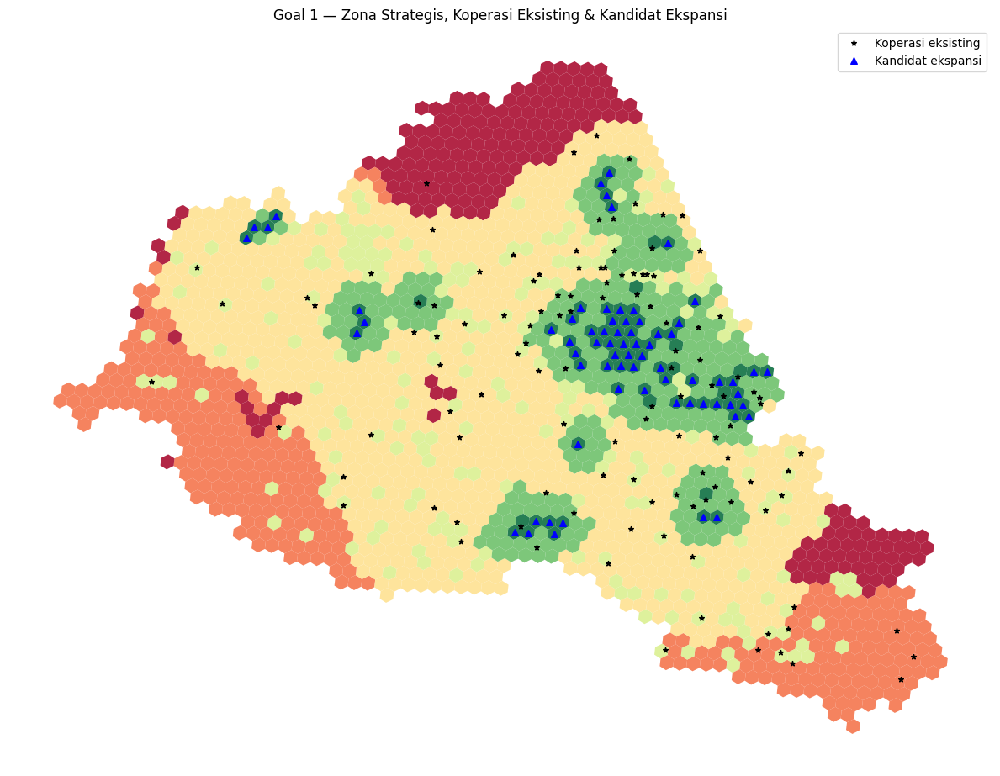


Disimpan: features_h3_res8.csv | koperasi_skoring.csv | kandidat_ekspansi.csv


In [ ]:
    # =========================================================
# TAHAP 8E — Rekomendasi Goal 1
# =========================================================
# Assign tiap koperasi ke cluster/tier heksagonnya
kop = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
kop['h3_index'] = [h3.latlng_to_cell(la, lo, RES) for la, lo in zip(kop.latitude, kop.longitude)]
info = gdf_hex.set_index('h3_index')[['cluster', 'tier_strategis', 'strategic_rank', 'accessibility_index']]
kop = kop.join(info, on='h3_index')

# (A) Koperasi di 2 tier terlemah -> PRIORITAS PENDAMPINGAN
low_clusters = order[-2:]
dampingi = kop[kop['cluster'].isin(low_clusters)].sort_values('accessibility_index')
print(f'(A) Koperasi prioritas pendampingan (zona lemah): {len(dampingi)} koperasi')
print(dampingi[['nama_koperasi', 'kecamatan', 'tier_strategis', 'accessibility_index']]
      .head(10).to_string(index=False))

# (B) Heksagon sangat strategis TANPA koperasi -> KANDIDAT EKSPANSI
top_clusters = order[:1]                       # cluster paling strategis
kand = gdf_hex[(gdf_hex['cluster'].isin(top_clusters)) & (gdf_hex['n_koperasi'] == 0)]
kand = kand.sort_values('accessibility_index', ascending=False)
kand_wgs = kand.to_crs(WGS)
kand_out = pd.DataFrame({
    'h3_index': kand['h3_index'].values,
    'lat': kand_wgs.geometry.centroid.y.values,
    'lon': kand_wgs.geometry.centroid.x.values,
    'accessibility': kand['accessibility_index'].round(3).values,
    'tier': kand['tier_strategis'].values,
})
print(f'\n(B) Kandidat ekspansi (zona strategis tanpa koperasi): {len(kand_out)} heksagon')
print(kand_out.head(10).to_string(index=False))

# Peta ringkas: tier + koperasi eksisting + kandidat ekspansi
fig, ax = plt.subplots(figsize=(12, 11))
gdf_hex.plot(column='strategic_rank', cmap='RdYlGn_r', linewidth=0, ax=ax, alpha=0.85)
g_kop = gpd.GeoDataFrame(kop, geometry=gpd.points_from_xy(kop.longitude, kop.latitude),
                         crs=WGS).to_crs(UTM)
g_kop.plot(ax=ax, color='black', markersize=18, marker='*', label='Koperasi eksisting')
gpd.GeoDataFrame(kand_out, geometry=gpd.points_from_xy(kand_out.lon, kand_out.lat),
                 crs=WGS).to_crs(UTM).plot(ax=ax, color='blue', markersize=30, marker='^',
                                           label='Kandidat ekspansi')
ax.set_title('Goal 1 — Zona Strategis, Koperasi Eksisting & Kandidat Ekspansi')
ax.legend(); ax.set_axis_off(); plt.tight_layout(); plt.show()

# Simpan hasil
out = gdf_hex.to_crs(WGS).copy(); out['geometry'] = out.geometry.to_wkt()
out.to_csv(os.path.join(DATA_DIR, 'features_h3_res8.csv'))
kop.drop(columns=['h3_index']).to_csv(os.path.join(DATA_DIR, 'koperasi_skoring.csv'), index=False)
kand_out.to_csv(os.path.join(DATA_DIR, 'kandidat_ekspansi.csv'), index=False)
print('\nDisimpan: features_h3_res8.csv | koperasi_skoring.csv | kandidat_ekspansi.csv')

In [ ]:
# =========================================================
# TAHAP 8F — Pertajam kandidat ekspansi (level pocket)
# =========================================================
import os, h3, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
WGS, UTM, RES = 'EPSG:4326', 'EPSG:32749', 8

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)

gdf_hex = load_csv_utm('features_h3_res8.csv')

# (1) Hex "terlayani" = hex berisi koperasi + tetangga langsung (k-ring)
SERVE_K = 1
served = set()
for c in gdf_hex.loc[gdf_hex.n_koperasi > 0, 'h3_index']:
    served |= set(h3.grid_disk(c, SERVE_K))

# (2) Pool kandidat = 2 tier teratas, tanpa koperasi, belum terlayani
TIERS = ['Sangat Strategis', 'Strategis']
cand = gdf_hex[gdf_hex.tier_strategis.isin(TIERS) & (gdf_hex.n_koperasi == 0)].copy()
cand = cand[~cand.h3_index.isin(served)]
cand_set = set(cand.h3_index)
print(f'Heksagon kandidat setelah filter: {len(cand_set)} '
      f'(dari {(gdf_hex.tier_strategis.isin(TIERS)).sum()} hex tier atas)')

# (3) Connected components (pocket) via adjacency H3
visited, groups = set(), []
for start in cand_set:
    if start in visited:
        continue
    stack, comp = [start], []
    while stack:
        x = stack.pop()
        if x in visited:
            continue
        visited.add(x); comp.append(x)
        for nb in h3.grid_disk(x, 1):
            if nb in cand_set and nb not in visited:
                stack.append(nb)
    groups.append(comp)
print('Jumlah pocket kandidat:', len(groups))

Heksagon kandidat setelah filter: 154 (dari 361 hex tier atas)
Jumlah pocket kandidat: 17


Total rekomendasi ekspansi (level pocket): 17
       h3_index  n_hex_pocket       lat        lon  accessibility      lokasi_terdekat  jarak_nama_m
888d8d61c3fffff            42 -7.407944 109.243983          0.979 Bancar Kembar Permai         458.0
888d8d604bfffff             5 -7.465389 109.270452          0.813           Kalikidang         455.0
888d8d75abfffff             9 -7.525352 109.192721          0.812         Tambaknegara          92.0
888d8d6f67fffff            11 -7.329960 109.232390          0.801          Kemutug Lor         348.0
888d899b49fffff            28 -7.407924 109.081746          0.791            Ajibarang         172.0
888d8d7597fffff            11 -7.538280 109.166252          0.772        Banjarparakan         220.0
888d8d6363fffff             2 -7.439881 109.331628          0.764          Jompo Kulon         616.0
888d8d6addfffff             3 -7.366988 109.273757          0.748              Ciberem         789.0
888d8d70abfffff            10 -7.530308 109.3

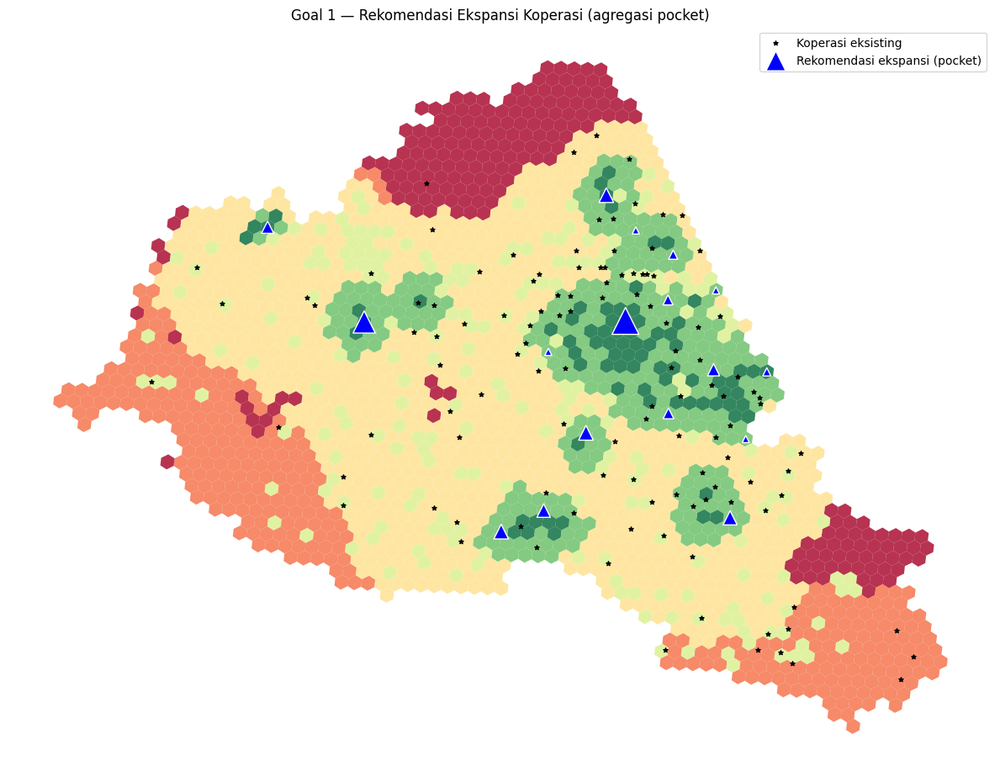


Disimpan: rekomendasi_ekspansi.csv


In [ ]:
# =========================================================
# TAHAP 8G — Titik representatif tiap pocket + penamaan
# =========================================================
acc = gdf_hex.set_index('h3_index')['accessibility_index']

recs = []
for comp in groups:
    best = max(comp, key=lambda h: acc.get(h, 0))      # hex paling strategis sbg wakil
    lat, lon = h3.cell_to_latlng(best)
    recs.append({'h3_index': best, 'n_hex_pocket': len(comp),
                 'lat': lat, 'lon': lon, 'accessibility': round(float(acc.get(best, 0)), 3)})
rec = pd.DataFrame(recs).sort_values('accessibility', ascending=False).reset_index(drop=True)

# Nama permukiman terdekat (pakai g_perm yang punya 'name')
g_perm = load_csv_utm('osm_permukiman.csv'); g_perm['geometry'] = g_perm.geometry.centroid
named = g_perm[g_perm['name'].notna() & (g_perm['name'].astype(str) != 'nan')]
rec_g = gpd.GeoDataFrame(rec, geometry=gpd.points_from_xy(rec.lon, rec.lat), crs=WGS).to_crs(UTM)
near = gpd.sjoin_nearest(rec_g[['geometry']], named[['name', 'geometry']], distance_col='d')
near = near.sort_values('d').groupby(level=0).first()
rec['lokasi_terdekat'] = rec.index.map(near['name'])
rec['jarak_nama_m']    = rec.index.map(near['d']).round(0)

print(f'Total rekomendasi ekspansi (level pocket): {len(rec)}')
print(rec.head(15).to_string(index=False))

# Peta
fig, ax = plt.subplots(figsize=(12, 11))
gdf_hex.plot(column='strategic_rank', cmap='RdYlGn_r', linewidth=0, ax=ax, alpha=0.8)
g_kop = load_csv_utm('features_h3_res8.csv')  # placeholder; pakai koperasi.csv
kop = pd.read_csv(os.path.join(DATA_DIR, 'koperasi.csv'))
gpd.GeoDataFrame(kop, geometry=gpd.points_from_xy(kop.longitude, kop.latitude),
                 crs=WGS).to_crs(UTM).plot(ax=ax, color='black', markersize=15,
                                           marker='*', label='Koperasi eksisting')
rec_g2 = gpd.GeoDataFrame(rec, geometry=gpd.points_from_xy(rec.lon, rec.lat),
                          crs=WGS).to_crs(UTM)
rec_g2.plot(ax=ax, color='blue', markersize=rec['n_hex_pocket'] * 12 + 25,
            marker='^', edgecolor='white', label='Rekomendasi ekspansi (pocket)')
ax.set_title('Goal 1 — Rekomendasi Ekspansi Koperasi (agregasi pocket)')
ax.legend(); ax.set_axis_off(); plt.tight_layout(); plt.show()

rec.to_csv(os.path.join(DATA_DIR, 'rekomendasi_ekspansi.csv'), index=False)
print('\nDisimpan: rekomendasi_ekspansi.csv')

In [ ]:
# =========================================================
# TAHAP 9A (perbaikan) — Siapkan layer (WGS84, kolom ramping)
# =========================================================
import os, numpy as np, pandas as pd, geopandas as gpd

DATA_DIR = '/content/drive/MyDrive/KDMP_Banyumas/data'
PROJECT_DIR = '/content/drive/MyDrive/KDMP_Banyumas'
WGS, UTM = 'EPSG:4326', 'EPSG:32749'

def load_csv_utm(name):
    df = pd.read_csv(os.path.join(DATA_DIR, name), index_col=0, low_memory=False)
    g = gpd.GeoSeries.from_wkt(df['geometry'])
    gdf = gpd.GeoDataFrame(df.drop(columns='geometry'), geometry=g, crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty]

# Layer 1: heksagon tier strategis
hex_wgs = load_csv_utm('features_h3_res8.csv')[
    ['h3_index', 'tier_strategis', 'strategic_rank', 'accessibility_index',
     'n_koperasi', 'dens_bangunan', 'geometry']].copy()
hex_wgs['accessibility_index'] = hex_wgs['accessibility_index'].round(3)

# Layer 2: koperasi eksisting (kolom skor namanya accessibility_index)
kop = pd.read_csv(os.path.join(DATA_DIR, 'koperasi_skoring.csv'))
print('Kolom koperasi_skoring:', list(kop.columns))
kop = kop.rename(columns={'accessibility_index': 'accessibility'})
kop_pts = kop[['nama_koperasi', 'kecamatan', 'progres_pct', 'tier_strategis',
               'accessibility', 'latitude', 'longitude']].copy()

# Layer 3: rekomendasi ekspansi (sudah punya kolom 'accessibility')
rec = pd.read_csv(os.path.join(DATA_DIR, 'rekomendasi_ekspansi.csv'))

print('Layer siap -> heksagon:', len(hex_wgs), '| koperasi:', len(kop_pts), '| rekomendasi:', len(rec))

Kolom koperasi_skoring: ['no', 'nama_koperasi', 'provinsi', 'kota', 'kecamatan', 'desa', 'progres_pct', 'kategori_progres', 'longitude', 'latitude', 'cluster', 'tier_strategis', 'strategic_rank', 'accessibility_index']
Layer siap -> heksagon: 1954 | koperasi: 117 | rekomendasi: 17


In [ ]:
# =========================================================
# TAHAP 9B — Dashboard kepler.gl -> HTML
# =========================================================
!pip install -q keplergl
from keplergl import KeplerGl

# Fokuskan peta ke Banyumas
config = {'version': 'v1', 'config': {'mapState':
          {'latitude': -7.45, 'longitude': 109.2, 'zoom': 9.5}}}

m = KeplerGl(height=700, config=config)
m.add_data(data=hex_wgs, name='Tier Strategis (heksagon)')
m.add_data(data=kop_pts, name='Koperasi Eksisting')
m.add_data(data=rec,     name='Rekomendasi Ekspansi')

out_html = os.path.join(PROJECT_DIR, 'dashboard_goal1_kepler.html')
m.save_to_html(file_name=out_html)
print('Dashboard kepler.gl disimpan:', out_html)
m   # coba tampilkan inline (kadang perlu enable widget; kalau kosong, buka file HTML-nya)

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to /content/drive/MyDrive/KDMP_Banyumas/dashboard_goal1_kepler.html!
Dashboard kepler.gl disimpan: /content/drive/MyDrive/KDMP_Banyumas/dashboard_goal1_kepler.html


KeplerGl(config={'version': 'v1', 'config': {'mapState': {'latitude': -7.45, 'longitude': 109.2, 'zoom': 9.5}}…

In [ ]:
# =========================================================
# TAHAP 9C (revisi) — Folium: semua variabel sebagai layer
# =========================================================
import folium
from folium.plugins import HeatMap

def to_points_wgs(name):
    g = load_csv_utm(name)
    g['geometry'] = g.to_crs(UTM).geometry.centroid.to_crs(WGS)
    return g

g_kes  = to_points_wgs('osm_kesehatan.csv')
g_edu  = to_points_wgs('osm_pendidikan.csv')
g_perm = to_points_wgs('osm_permukiman.csv')

g_road = load_csv_utm('osm_jalan_edges.csv')
main = g_road[g_road['highway'].astype(str)
              .str.contains('motorway|trunk|primary|secondary', na=False)].copy()
main['geometry'] = main.to_crs(UTM).geometry.simplify(25).to_crs(WGS)

g_bld = load_csv_utm('osm_bangunan.csv')
bld_pts = g_bld.to_crs(UTM).geometry.centroid.to_crs(WGS)
bld_pts = bld_pts.sample(min(15000, len(bld_pts)), random_state=1)

fm = folium.Map(location=[-7.45, 109.2], zoom_start=10, tiles='CartoDB positron')

# Heksagon tier strategis
warna = {0:'#1a9850',1:'#91cf60',2:'#d9ef8b',3:'#fee08b',4:'#fc8d59',5:'#d73027'}
folium.GeoJson(hex_wgs.to_json(),
    style_function=lambda f: {'fillColor': warna.get(f['properties']['strategic_rank'], '#ccc'),
                              'color': '#fff', 'weight': 0, 'fillOpacity': 0.55},
    tooltip=folium.GeoJsonTooltip(fields=['tier_strategis', 'accessibility_index', 'dens_bangunan']),
    name='Tier Strategis').add_to(fm)

# Jalan utama
folium.GeoJson(main[['highway', 'name', 'geometry']].to_json(),
    style_function=lambda f: {'color': '#555', 'weight': 1.2},
    name='Jalan Utama', show=False).add_to(fm)

# Helper layer titik
def point_layer(gdf, name, color, fields, show=False):
    fg = folium.FeatureGroup(name=name, show=show)
    for _, r in gdf.iterrows():
        popup = '<br>'.join(f"{k}: {r[k]}" for k in fields if k in gdf.columns)
        folium.CircleMarker([r.geometry.y, r.geometry.x], radius=3, color=color,
                            fill=True, fill_opacity=0.85, popup=popup).add_to(fg)
    fg.add_to(fm)

point_layer(g_kes,  'Fasilitas Kesehatan',  'green',  ['name', 'amenity'])
point_layer(g_edu,  'Fasilitas Pendidikan', 'darkblue', ['name', 'amenity'])
point_layer(g_perm, 'Permukiman',           'orange', ['name', 'place'])

# Koperasi (nyala)
gk = folium.FeatureGroup(name='Koperasi Eksisting', show=True)
for _, r in kop_pts.iterrows():
    folium.CircleMarker([r.latitude, r.longitude], radius=3, color='black', fill=True,
        fill_opacity=0.9,
        popup=f"{r.nama_koperasi}<br>acc {r.accessibility:.2f} | {r.tier_strategis}").add_to(gk)
gk.add_to(fm)

# Rekomendasi ekspansi (nyala)
gr = folium.FeatureGroup(name='Rekomendasi Ekspansi', show=True)
for _, r in rec.iterrows():
    folium.CircleMarker([r.lat, r.lon], radius=4 + r.n_hex_pocket * 0.4, color='blue', fill=True,
        fill_opacity=0.7,
        popup=f"{r.lokasi_terdekat}<br>{int(r.n_hex_pocket)} hex | acc {r.accessibility:.2f}").add_to(gr)
gr.add_to(fm)

# Kepadatan bangunan (heatmap)
hb = folium.FeatureGroup(name='Kepadatan Bangunan', show=False)
HeatMap([[p.y, p.x] for p in bld_pts], radius=7, blur=9).add_to(hb)
hb.add_to(fm)

folium.LayerControl(position='topright', collapsed=False).add_to(fm)
out_fol = os.path.join(PROJECT_DIR, 'dashboard_goal1_folium.html')
fm.save(out_fol)
print('Folium dashboard:', out_fol)
fm

Folium dashboard: /content/drive/MyDrive/KDMP_Banyumas/dashboard_goal1_folium.html


In [ ]:
# =========================================================
# TAHAP 9D — Ekspor file untuk di-import ke kepler.gl/demo
# (jalankan SETELAH 9C — memakai g_kes/g_edu/g_perm/main/bld_pts)
# =========================================================
GJ = os.path.join(PROJECT_DIR, 'kepler_geojson'); os.makedirs(GJ, exist_ok=True)

def save_geojson(gdf, fname):
    with open(os.path.join(GJ, fname), 'w') as f:
        f.write(gdf.to_json())     # pure-python, tanpa driver -> aman di Colab

# Heksagon LENGKAP (semua variabel) -> bisa diwarnai variabel apa pun di kepler
save_geojson(load_csv_utm('features_h3_res8.csv'), 'hex_features_all.geojson')

# Titik
kop_g = gpd.GeoDataFrame(kop_pts, geometry=gpd.points_from_xy(kop_pts.longitude, kop_pts.latitude), crs=WGS)
rec_g = gpd.GeoDataFrame(rec, geometry=gpd.points_from_xy(rec.lon, rec.lat), crs=WGS)
save_geojson(kop_g, 'koperasi.geojson')
save_geojson(rec_g, 'rekomendasi_ekspansi.geojson')
save_geojson(g_kes[['name', 'amenity', 'geometry']],  'kesehatan.geojson')
save_geojson(g_edu[['name', 'amenity', 'geometry']],  'pendidikan.geojson')
save_geojson(g_perm[['name', 'place', 'geometry']],   'permukiman.geojson')
save_geojson(main[['highway', 'name', 'geometry']],   'jalan_utama.geojson')

# Bangunan: CSV lat/lon (ringan untuk kepler)
pd.DataFrame({'lat': [p.y for p in bld_pts], 'lon': [p.x for p in bld_pts]}).to_csv(
    os.path.join(GJ, 'bangunan_sample.csv'), index=False)

print('File kepler tersimpan di:', GJ)
for f in sorted(os.listdir(GJ)):
    sz = os.path.getsize(os.path.join(GJ, f)) / 1024
    print(f'  - {f}  ({sz:,.0f} KB)')

File kepler tersimpan di: /content/drive/MyDrive/KDMP_Banyumas/kepler_geojson
  - bangunan_sample.csv  (554 KB)
  - hex_features_all.geojson  (1,704 KB)
  - jalan_utama.geojson  (1,591 KB)
  - kesehatan.geojson  (8 KB)
  - koperasi.geojson  (44 KB)
  - pendidikan.geojson  (35 KB)
  - permukiman.geojson  (94 KB)
  - rekomendasi_ekspansi.geojson  (5 KB)


In [ ]:
# TAHAP 10A — Produk unggulan per kecamatan dari data 2025 (BPS Banyumas, kuintal)
# !pip install --upgrade pandas numpy
import os, re, numpy as np, pandas as pd, geopandas as gpd
DATA_DIR='/content/drive/MyDrive/KDMP_Banyumas/data'; PROJECT_DIR='/content/drive/MyDrive/KDMP_Banyumas'
WGS, UTM, RES = 'EPSG:4326','EPSG:32749',8
BT_FILE='Produksi Tanaman Buah-buahan dan Sayuran Tahunan Menurut Kecamatan dan Jenis Tanaman di Kabupaten Banyumas, 2025.csv'
bt=pd.read_csv(os.path.join(DATA_DIR,BT_FILE)); bt.columns=[c.replace('\ufeff','').strip() for c in bt.columns]
bt=bt.rename(columns={bt.columns[0]:'kecamatan'})
clean=lambda c: re.sub(r'\s*\(kuintal\)\s*\(Kw\)','',c).replace('Produksi ','').strip()
bt=bt.rename(columns={c:clean(c) for c in bt.columns if c!='kecamatan'})
for c in bt.columns[1:]:
    bt[c]=pd.to_numeric(bt[c].astype(str).str.replace('-','0',regex=False).str.strip(),errors='coerce').fillna(0)
bt['kecamatan']=bt['kecamatan'].str.strip().replace({'Kedung Banteng':'Kedungbanteng'})
KEC=['Lumbir','Wangon','Jatilawang','Rawalo','Kebasen','Kemranjen','Sumpiuh','Tambak','Somagede','Kalibagor',
 'Banyumas','Patikraja','Purwojati','Ajibarang','Gumelar','Pekuncen','Cilongok','Karanglewas','Kedungbanteng',
 'Baturraden','Sumbang','Kembaran','Sokaraja','Purwokerto Selatan','Purwokerto Barat','Purwokerto Timur','Purwokerto Utara']
body=bt[bt['kecamatan'].isin(KEC)].copy()
dup=body[body['kecamatan']=='Banyumas']
if len(dup)>1:                                  # buang baris TOTAL kabupaten bila ada
    komc=[c for c in bt.columns if c!='kecamatan']; keep=dup[komc].sum(axis=1).idxmin()
    body=body.drop(index=[i for i in dup.index if i!=keep])
body=body.reset_index(drop=True); komoditas=[c for c in bt.columns if c!='kecamatan']

In [ ]:
# TAHAP 10B — Location Quotient + produk unggulan per kecamatan
piv=body.set_index('kecamatan')[komoditas]; Xi,Xj,Xt=piv.sum(1),piv.sum(0),piv.values.sum()
LQ=piv.div(Xi,axis=0).div(Xj/Xt,axis=1).fillna(0); pangsa=piv.div(Xj,axis=1).fillna(0)*100
rows=[]
for kec in piv.index:
    s=LQ.loc[kec]
    basis=sorted([(k,round(float(s[k]),2),round(float(pangsa.loc[kec,k]),1))
                  for k in komoditas if s[k]>=1 and piv.loc[kec,k]>0],key=lambda t:-t[1])
    sig=[b for b in basis if b[2]>=10][:3]; big=piv.loc[kec].idxmax()
    rows.append(dict(kecamatan=kec,komoditas_terbesar=big,nilai_terbesar_kw=round(float(piv.loc[kec,big]),1),
        unggulan_lq=basis[0][0] if basis else '-',lq_value=basis[0][1] if basis else 0.0,
        basis_signifikan='; '.join(f'{k}(LQ{l},{p}%)' for k,l,p in sig) or '-',n_basis=len(basis)))
prof_kom=pd.DataFrame(rows).set_index('kecamatan')

/tmp/ipykernel_10869/3920629704.py:2: Pandas4Warning: Starting with pandas version 4.0 all arguments of sum will be keyword-only.
  piv=body.set_index('kecamatan')[komoditas]; Xi,Xj,Xt=piv.sum(1),piv.sum(0),piv.values.sum()
/tmp/ipykernel_10869/3920629704.py:2: Pandas4Warning: Starting with pandas version 4.0 all arguments of sum will be keyword-only.
  piv=body.set_index('kecamatan')[komoditas]; Xi,Xj,Xt=piv.sum(1),piv.sum(0),piv.values.sum()


In [ ]:
# TAHAP 10C — Tag heksagon -> kecamatan (koperasi terdekat) + join komoditas
def load_csv_utm(name):
    df=pd.read_csv(os.path.join(DATA_DIR,name),index_col=0,low_memory=False)
    g=gpd.GeoSeries.from_wkt(df['geometry']); gdf=gpd.GeoDataFrame(df.drop(columns='geometry'),geometry=g,crs=WGS)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].to_crs(UTM)
gdf_hex=load_csv_utm('features_h3_res8.csv')
kop=pd.read_csv(os.path.join(DATA_DIR,'koperasi.csv'))
kop_g=gpd.GeoDataFrame(kop,geometry=gpd.points_from_xy(kop.longitude,kop.latitude),crs=WGS).to_crs(UTM)
hexc=gpd.GeoDataFrame(geometry=gdf_hex.geometry.centroid.values,crs=UTM)
nn=gpd.sjoin_nearest(hexc,kop_g[['kecamatan','geometry']],distance_col='_d')
nn=nn[~nn.index.duplicated(keep='first')].sort_index()
gdf_hex['kecamatan']=nn['kecamatan'].values
gdf_hex=gdf_hex.merge(prof_kom,on='kecamatan',how='left')

In [ ]:
# TAHAP 10D — Join komoditas ke koperasi & rekomendasi
kop_kom=kop.merge(prof_kom.reset_index(),on='kecamatan',how='left')
rec=pd.read_csv(os.path.join(DATA_DIR,'rekomendasi_ekspansi.csv'))
rec_g=gpd.GeoDataFrame(rec,geometry=gpd.points_from_xy(rec.lon,rec.lat),crs=WGS).to_crs(UTM)
nn2=gpd.sjoin_nearest(rec_g[['geometry']],kop_g[['kecamatan','geometry']],distance_col='_d')
nn2=nn2[~nn2.index.duplicated(keep='first')].sort_index()
rec['kecamatan']=nn2['kecamatan'].values; rec=rec.merge(prof_kom.reset_index(),on='kecamatan',how='left')

In [ ]:
# TAHAP 10E — Ekspor GeoJSON siap kepler.gl
GJ=os.path.join(PROJECT_DIR,'kepler_geojson'); os.makedirs(GJ,exist_ok=True)
def save_geojson(gdf,fname):
    open(os.path.join(GJ,fname),'w').write(gdf.to_crs(WGS).to_json())
hex_cols=[c for c in ['h3_index','kecamatan','tier_strategis','strategic_rank','accessibility_index',
 'n_koperasi','komoditas_terbesar','nilai_terbesar_kw','unggulan_lq','lq_value','basis_signifikan','geometry'] if c in gdf_hex.columns]
save_geojson(gdf_hex[hex_cols],'hex_komoditas_2025.geojson')
kop_g2=gpd.GeoDataFrame(kop_kom,geometry=gpd.points_from_xy(kop_kom.longitude,kop_kom.latitude),crs=WGS)
save_geojson(kop_g2,'koperasi_komoditas_2025.geojson')
rec_g2=gpd.GeoDataFrame(rec,geometry=gpd.points_from_xy(rec.lon,rec.lat),crs=WGS)
save_geojson(rec_g2,'rekomendasi_komoditas_2025.geojson')

In [ ]:
# =========================================================
# TAHAP 10D — Folium: + Potensi Unggulan Wilayah (LQ)
# Jalankan setelah TAHAP 10 (butuh: gdf_hex ber-kecamatan+unggulan_lq, prof_kom, rec)
# =========================================================
import folium
from folium.plugins import HeatMap

# Ensure required variables are defined or reloaded if not persisted
# This ensures `rec`, `prof_kom`, `kop_g` have the expected state
# from TAHAP 10B and 10C/10D before proceeding.
# Re-create kop_g and re-process rec to include 'kecamatan', 'unggulan_lq', 'lq_value'
# This part is extracted and adapted from cell IXfnIXziUXJ3 (TAHAP 10D - Join komoditas)
kop_raw = pd.read_csv(os.path.join(DATA_DIR,'koperasi.csv'))
kop_g = gpd.GeoDataFrame(kop_raw,geometry=gpd.points_from_xy(kop_raw.longitude,kop_raw.latitude),crs=WGS).to_crs(UTM)
rec = pd.read_csv(os.path.join(DATA_DIR,'rekomendasi_ekspansi.csv'))
rec_g = gpd.GeoDataFrame(rec,geometry=gpd.points_from_xy(rec.lon,rec.lat),crs=WGS).to_crs(UTM)
nn2 = gpd.sjoin_nearest(rec_g[['geometry']],kop_g[['kecamatan','geometry']],distance_col='_d')
nn2 = nn2[~nn2.index.duplicated(keep='first')].sort_index()
rec['kecamatan'] = nn2['kecamatan'].values
rec = rec.merge(prof_kom.reset_index(),on='kecamatan',how='left')

def to_points_wgs(name):
    g = load_csv_utm(name)
    g['geometry'] = g.to_crs(UTM).geometry.centroid.to_crs(WGS)
    return g

g_kes  = to_points_wgs('osm_kesehatan.csv')
g_edu  = to_points_wgs('osm_pendidikan.csv')
g_perm = to_points_wgs('osm_permukiman.csv')

g_road = load_csv_utm('osm_jalan_edges.csv')
main = g_road[g_road['highway'].astype(str)
              .str.contains('motorway|trunk|primary|secondary', na=False)].copy()
main['geometry'] = main.to_crs(UTM).geometry.simplify(25).to_crs(WGS)

g_bld = load_csv_utm('osm_bangunan.csv')
bld_pts = g_bld.to_crs(UTM).geometry.centroid.to_crs(WGS)
bld_pts = bld_pts.sample(min(15000, len(bld_pts)), random_state=1)

# heksagon (WGS) hasil TAHAP 10 -> sudah punya tier + kecamatan + unggulan_lq + lq_value
hex_wgs = gdf_hex.to_crs(WGS).copy()

# koperasi: tier/aksesibilitas (TAHAP 9A) + unggulan LQ wilayahnya (prof_kom)
kop_pts = kop_pts.merge(prof_kom[['unggulan_lq', 'lq_value']].reset_index(),
                        on='kecamatan', how='left')

# palet warna kategori untuk unggulan_lq
PAL = ['#e6194B','#3cb44b','#ffe119','#4363d8','#f58231','#911eb4','#42d4f4','#f032e6','#bfef45',
       '#fabed4','#469990','#dcbeff','#9A6324','#fffac8','#800000','#aaffc3','#808000','#000075']
coms = sorted(hex_wgs['unggulan_lq'].dropna().unique())
cmap = {c: PAL[i % len(PAL)] for i, c in enumerate(coms)}

fm = folium.Map(location=[-7.45, 109.2], zoom_start=10, tiles='CartoDB positron')

# === Potensi Unggulan Wilayah (LQ) — layer utama Goal 1 ===
folium.GeoJson(hex_wgs[['kecamatan', 'unggulan_lq', 'lq_value', 'geometry']].to_json(),
    style_function=lambda f: {'fillColor': cmap.get(f['properties']['unggulan_lq'], '#cccccc'),
                              'color': '#fff', 'weight': 0, 'fillOpacity': 0.6},
    tooltip=folium.GeoJsonTooltip(fields=['kecamatan', 'unggulan_lq', 'lq_value'],
                                  aliases=['Kecamatan', 'Unggulan (LQ)', 'Nilai LQ']),
    name='Potensi Unggulan Wilayah (LQ)').add_to(fm)

# === Heksagon tier strategis ===
warna = {0:'#1a9850', 1:'#91cf60', 2:'#d9ef8b', 3:'#fee08b', 4:'#fc8d59', 5:'#d73027'}
folium.GeoJson(hex_wgs[['tier_strategis', 'strategic_rank', 'accessibility_index', 'geometry']].to_json(),
    style_function=lambda f: {'fillColor': warna.get(f['properties']['strategic_rank'], '#ccc'),
                              'color': '#fff', 'weight': 0, 'fillOpacity': 0.55},
    tooltip=folium.GeoJsonTooltip(fields=['tier_strategis', 'accessibility_index']),
    name='Tier Strategis', show=False).add_to(fm)

# === Jalan utama ===
folium.GeoJson(main[['highway', 'name', 'geometry']].to_json(),
    style_function=lambda f: {'color': '#555', 'weight': 1.2},
    name='Jalan Utama', show=False).add_to(fm)

# === Helper layer titik ===
def point_layer(gdf, name, color, fields, show=False):
    fg = folium.FeatureGroup(name=name, show=show)
    for _, r in gdf.iterrows():
        popup = '<br>'.join(f"{k}: {r[k]}" for k in fields if k in gdf.columns)
        folium.CircleMarker([r.geometry.y, r.geometry.x], radius=3, color=color,
                            fill=True, fill_opacity=0.85, popup=popup).add_to(fg)
    fg.add_to(fm)

point_layer(g_kes,  'Fasilitas Kesehatan',  'green',    ['name', 'amenity'])
point_layer(g_edu,  'Fasilitas Pendidikan', 'darkblue', ['name', 'amenity'])
point_layer(g_perm, 'Permukiman',           'orange',   ['name', 'place'])

# === Koperasi (nyala) — warna = unggulan LQ wilayahnya ===
gk = folium.FeatureGroup(name='Koperasi Eksisting', show=True)
for _, r in kop_pts.iterrows():
    folium.CircleMarker([r.latitude, r.longitude], radius=5, color='black', weight=0.8,
        fill=True, fill_color=cmap.get(r.unggulan_lq, '#333'), fill_opacity=0.95,
        tooltip=f"{r.kecamatan} — {r.unggulan_lq}",
        popup=folium.Popup(f"<b>{r.nama_koperasi}</b><br>Kec: {r.kecamatan}"
                           f"<br>Unggulan (LQ): {r.unggulan_lq} (LQ {r.lq_value})"
                           f"<br>Tier: {r.tier_strategis} | acc {r.accessibility:.2f}",
                           max_width=320)).add_to(gk)
gk.add_to(fm)

# === Rekomendasi ekspansi (nyala) ===
gr = folium.FeatureGroup(name='Rekomendasi Ekspansi', show=True)
for _, r in rec.iterrows():
    folium.CircleMarker([r.lat, r.lon], radius=4 + r.n_hex_pocket * 0.4, color='blue',
        fill=True, fill_opacity=0.7,
        popup=f"{r.lokasi_terdekat}<br>Kec: {r.kecamatan}<br>{int(r.n_hex_pocket)} hex | "
              f"acc {r.accessibility:.2f}<br>Unggulan (LQ): {r.unggulan_lq} (LQ {r.lq_value})").add_to(gr)
gr.add_to(fm)

# === Kepadatan bangunan (heatmap) ===
hb = folium.FeatureGroup(name='Kepadatan Bangunan', show=False)
HeatMap([[p.y, p.x] for p in bld_pts], radius=7, blur=9).add_to(hb)
hb.add_to(fm)

# === Legenda unggulan LQ ===
items = ''.join(f"<div><span style='background:{cmap[c]};width:12px;height:12px;"
                f"display:inline-block;margin-right:6px;border:1px solid #555'></span>{c}</div>"
                for c in coms)
legend = (f"<div style='position:fixed;bottom:20px;left:20px;z-index:9999;background:white;"
          f"padding:10px 12px;border:1px solid #888;border-radius:6px;font:12px sans-serif;"
          f"max-height:340px;overflow:auto'><b>Potensi Unggulan Wilayah (LQ)</b><br>{items}</div>")
fm.get_root().html.add_child(folium.Element(legend))

folium.LayerControl(position='topright', collapsed=False).add_to(fm)
out_fol = os.path.join(PROJECT_DIR, 'dashboard_goal1_folium.html')
fm.save(out_fol)
print('Folium dashboard:', out_fol)
fm

Folium dashboard: /content/drive/MyDrive/KDMP_Banyumas/dashboard_goal1_folium.html
